In [1]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import pandas as pd
import pickle
import os

from sklearn.linear_model import LinearRegression

regions = {0: 'imgs', 1: 'caudate', 2: 'cerebellum', 3: 'frontal_lobe', 4: 'insula', 5: 'occipital_lobe', 6: 'parietal_lobe', 7: 'putamen', 8: 'temporal_lobe', 9: 'thalamus'}
root = '/media/leelabsg-storage1/yein/research/test/'

In [2]:
def bias_correction(true, pred):
    reg = LinearRegression().fit(true.reshape(-1, 1), pred)
    beta_0 = reg.intercept_
    beta_1 = reg.coef_[0]

    corrected_pred = (pred - beta_0) / beta_1
    return corrected_pred

def pickel_load(root):

    map = dict()
    for _, v in regions.items():
        map[v] = {'pred_ages': [],
                 'true_ages': []}

    
    for cv_num in range(4):
        for content in ['pred_ages', 'true_ages']:
            pickel_path = os.path.join(root, str(cv_num), f'{content}.pickle')
            # print(pickel_path)
            with open(pickel_path, 'rb') as file:
                curr_cv = pickle.load(file) # cv-split size의 dict (region: age_lists)

            for _, v in regions.items():
                map[v][content].extend(curr_cv[v][0])

    # bias corrected pred age
    for region, age_list in map.items():
        print(region, len(map[region]['true_ages']), len(map[region]['pred_ages']))
        pred = np.array(map[region]['pred_ages'])
        true = np.array(map[region]['true_ages'])
        map[region]['corrected_pred_ages'] = bias_correction(true, pred)
    
    return map

def pickel_load_(root):
    map = dict()
    for _, v in regions.items():
        map[v] = {'pred_ages': [],
                 'true_ages': []}

    # pred_ages 4-cv model results gathering for averaging them
    for cv_num in range(4):
        pickel_path = os.path.join(root, str(cv_num), 'pred_ages.pickle')
        if os.path.exists(pickel_path):
            with open(pickel_path, 'rb') as file:
                curr_cv = pickle.load(file) # cv-split size의 dict (region: age_lists) # age_lists length: 630

                for region, age_list in curr_cv.items():
                    map[region]['pred_ages'].append(age_list[0])

    for region, age_list in map.items():
        pred_ages_lists = map[region]['pred_ages']
        pred_avg_age = [sum(values) / len(values) for values in zip(*pred_ages_lists)]
        print(len(pred_ages_lists), len(pred_avg_age))
        map[region]['pred_ages'] = pred_avg_age

    # true age
    pickel_path = os.path.join(root, str(0), 'true_ages.pickle')
    if os.path.exists(pickel_path):
        with open(pickel_path, 'rb') as file:
            curr_cv = pickle.load(file)
            
            for region, age_list in curr_cv.items():
                map[region]['true_ages'] = age_list[0]
                
    # bias corrected pred age
    for region, age_list in map.items():
        pred = np.array(map[region]['pred_ages'])
        true = np.array(map[region]['true_ages'])
        map[region]['corrected_pred_ages'] = bias_correction(true, pred)    
        print(region, len(map[region]['true_ages']), len(map[region]['pred_ages']), len(map[region]['pred_ages']))

    return map

def age_plot(pred, true, region):
    # True Age vs. Predicted Age
    if region == 'imgs':
        region = 'global'
    plt.figure(figsize=(10, 7))
    plt.scatter(true, pred, alpha=0.2)
    plt.plot([min(true), max(true)], [min(true), max(true)], color='red')  # y=x line
    plt.title(f'{region} ========== True Age and Predicted Age')
    plt.xlabel('True_Age')
    plt.ylabel('Predicted_Age')


def age_plot_comparison(pred1, true1, pred2, true2, region):
    # before transfer learning
    if region == 'imgs':
        region = 'global'
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.scatter(true1, pred1, alpha=0.2)
    plt.plot([min(true1), max(true1)], [min(true1), max(true1)], color='red')  # y=x line
    plt.title(f'Before Transfer Learning')
    plt.xlabel('True_Age')
    plt.ylabel('Predicted_Age')

    # after transfer learning
    plt.subplot(1, 2, 2)
    plt.scatter(true2, pred2, alpha=0.2)
    plt.plot([min(true2), max(true2)], [min(true2), max(true2)], color='red')  # y=x line
    plt.title(f'After Transfer Learning')
    plt.xlabel('True_Age')
    plt.ylabel('Predicted_Age')

    plt.suptitle(f'{region}', fontsize=15)

# Adni Plot

In [3]:
test_1 = root + 'adni/1/true_ages.pickle'

with open(test_1, 'rb') as file:
    test_1 = pickle.load(file) # cv-split size의 dict (region: age_lists)
    for _, v in regions.items():
        print(len(test_1[v][0]), test_1[v][0][:10])

630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]
630 [90.0, 76.5, 79.5, 94.7, 71.2, 70.8, 78.1, 70.0, 72.9, 74.2]


In [4]:
test_1 = root + 'adni/1/pred_ages.pickle'

with open(test_1, 'rb') as file:
    test_1 = pickle.load(file) # cv-split size의 dict (region: age_lists)
    for _, v in regions.items():
        print(len(test_1[v][0]), test_1[v][0][:10])

630 [62.66986, 60.753914, 64.28248, 63.192593, 60.747173, 60.614697, 60.26947, 60.20361, 62.724487, 61.768665]
630 [59.6839, 56.32712, 57.789707, 59.384315, 55.98649, 57.73142, 59.294235, 57.25936, 61.080017, 60.128094]
630 [61.61364, 63.12216, 60.39535, 61.12166, 59.572098, 62.45428, 61.56303, 60.85614, 59.29368, 59.31558]
630 [65.259964, 65.047325, 63.51034, 66.43748, 60.34525, 65.52892, 65.79798, 66.77165, 65.38369, 59.31363]
630 [66.14111, 63.898716, 65.4694, 64.06753, 65.35435, 66.166794, 59.35176, 64.498985, 65.64222, 64.98658]
630 [58.236217, 57.735523, 56.727283, 60.32566, 56.55485, 58.9863, 56.453693, 55.785397, 57.727448, 56.589092]
630 [61.935257, 59.447166, 57.528454, 62.81403, 58.1617, 63.799248, 57.282772, 60.336002, 60.413532, 60.51273]
630 [61.994137, 60.620094, 61.748016, 63.03784, 61.588806, 60.77614, 61.64267, 63.400276, 63.439175, 63.26851]
630 [68.7017, 67.97963, 67.52582, 70.79414, 69.26904, 68.32218, 69.293144, 67.49124, 69.32646, 68.93538]
630 [57.012375, 57.400

4 630
4 630
4 630
4 630
4 630
4 630
4 630
4 630
4 630
4 630
imgs 630 630 630
caudate 630 630 630
cerebellum 630 630 630
frontal_lobe 630 630 630
insula 630 630 630
occipital_lobe 630 630 630
parietal_lobe 630 630 630
putamen 630 630 630
temporal_lobe 630 630 630
thalamus 630 630 630
imgs 630 630
caudate 630 630
cerebellum 630 630
frontal_lobe 630 630
insula 630 630
occipital_lobe 630 630
parietal_lobe 630 630
putamen 630 630
temporal_lobe 630 630
thalamus 630 630


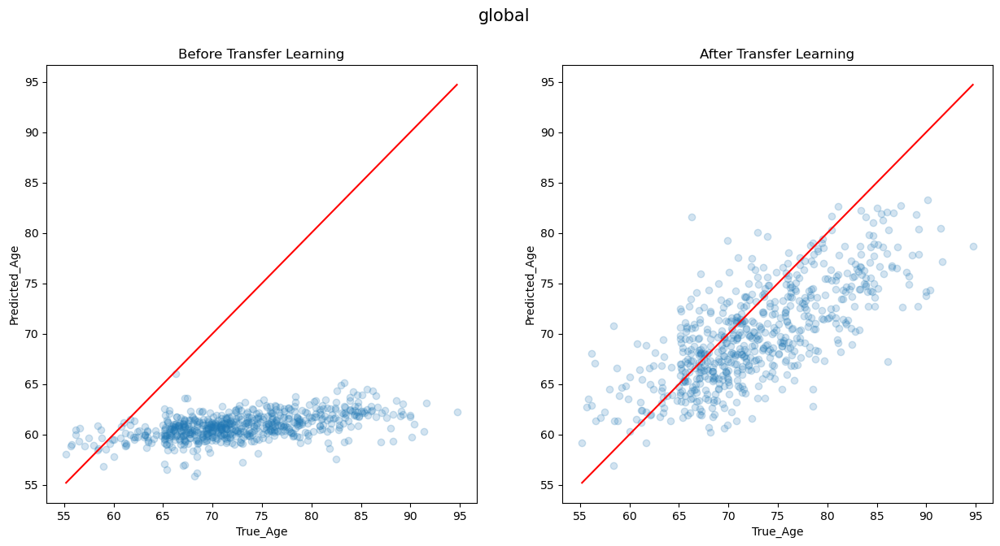

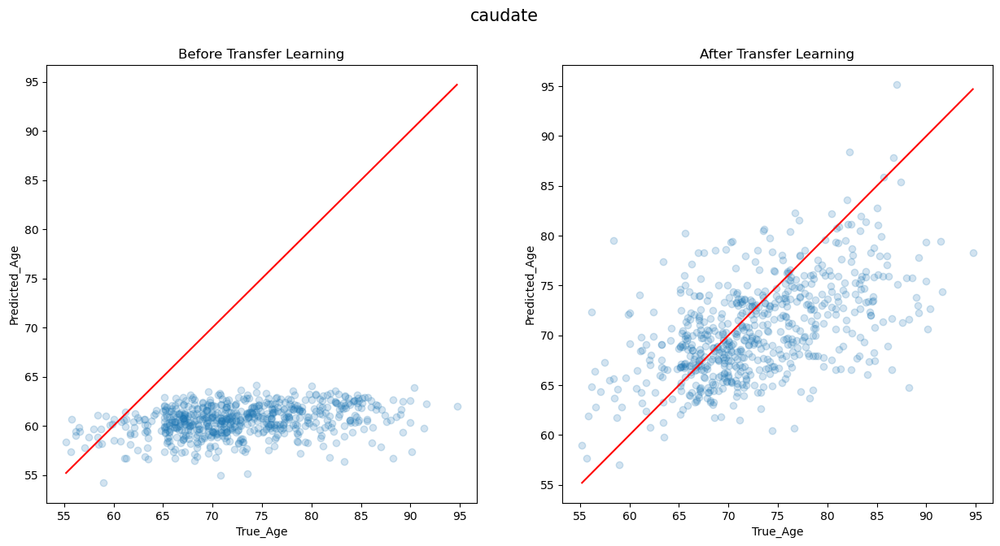

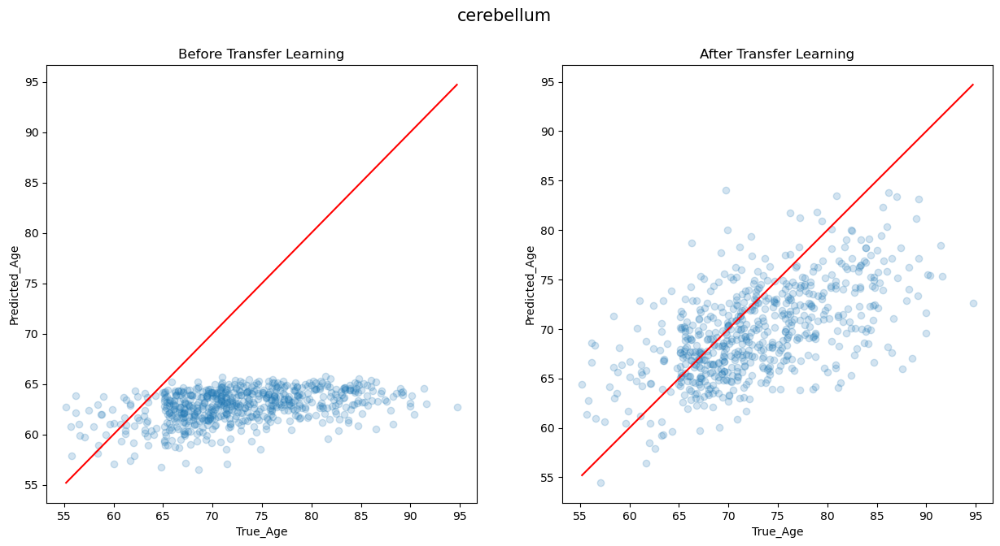

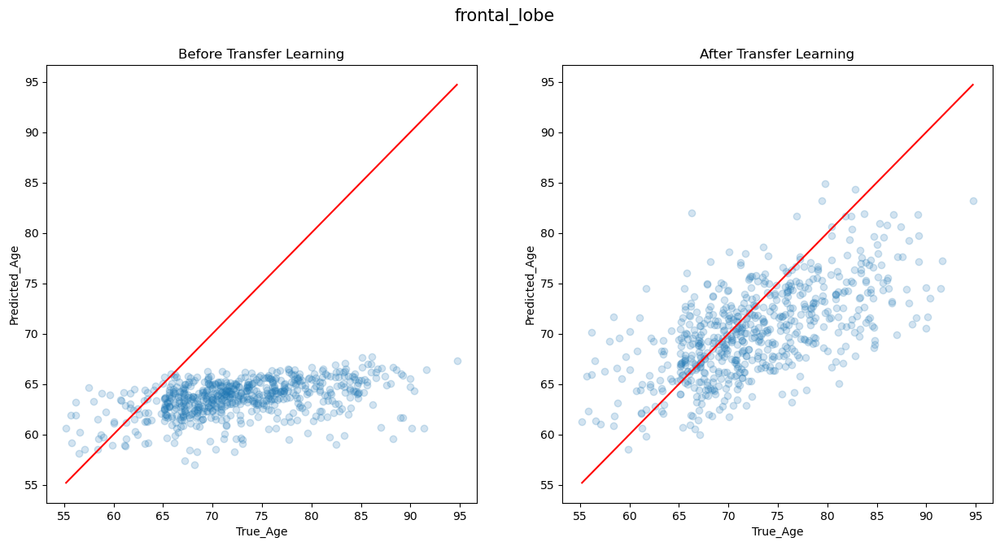

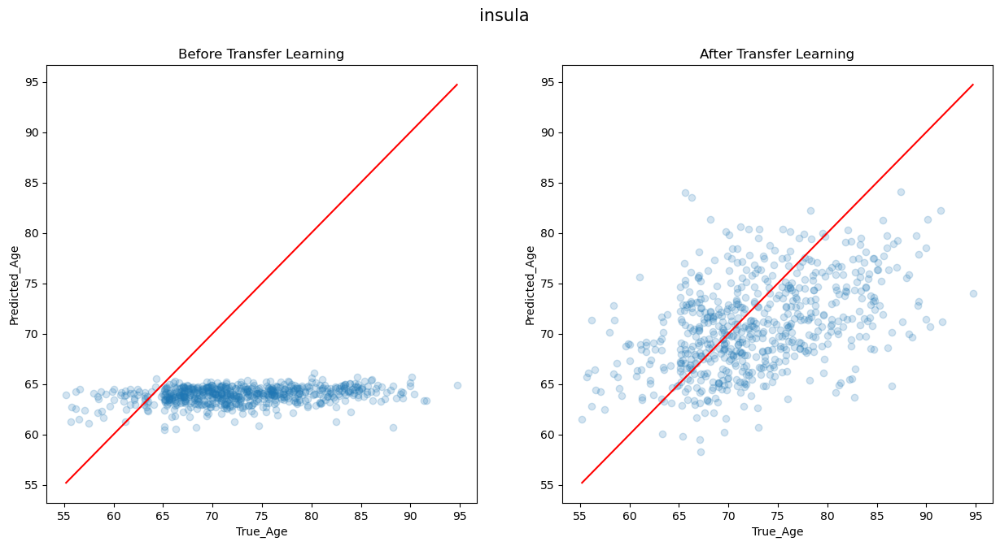

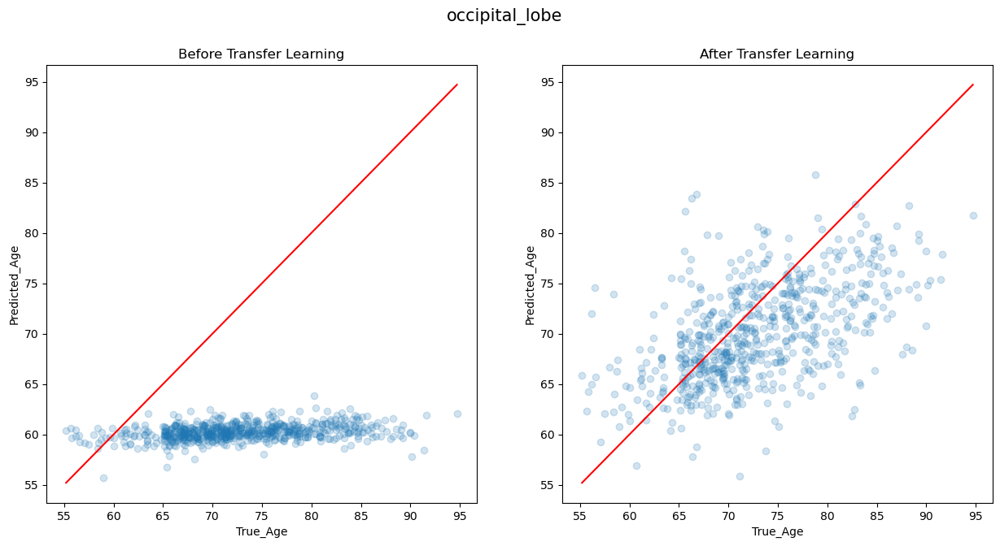

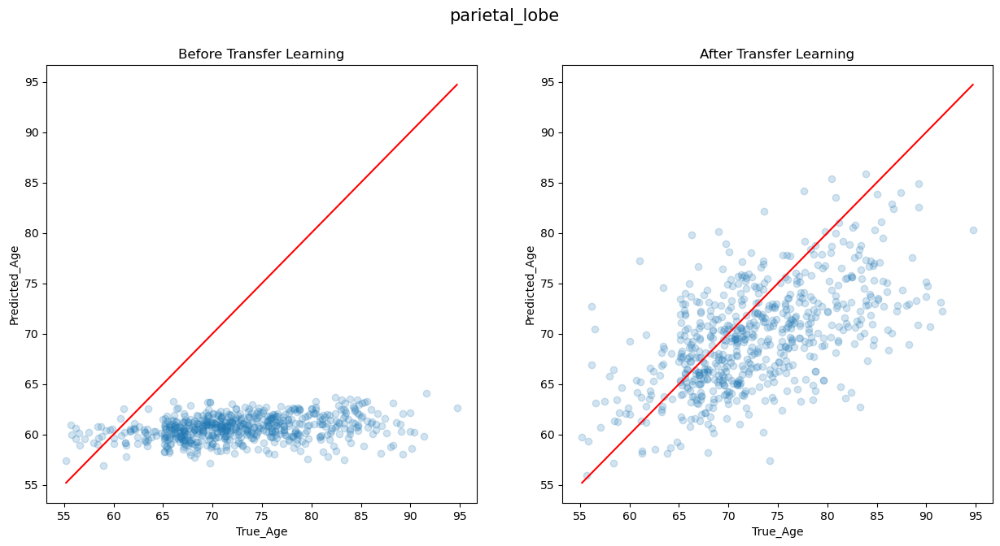

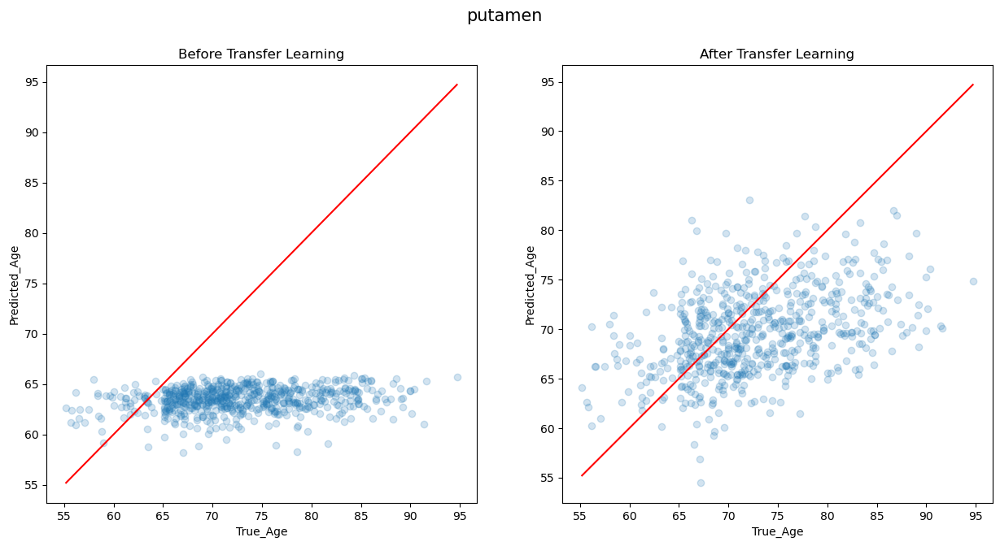

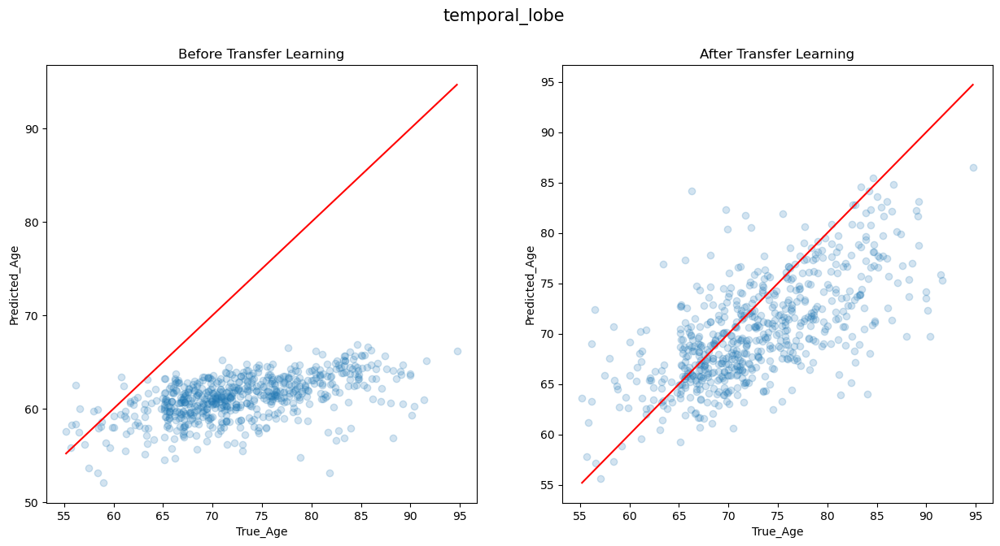

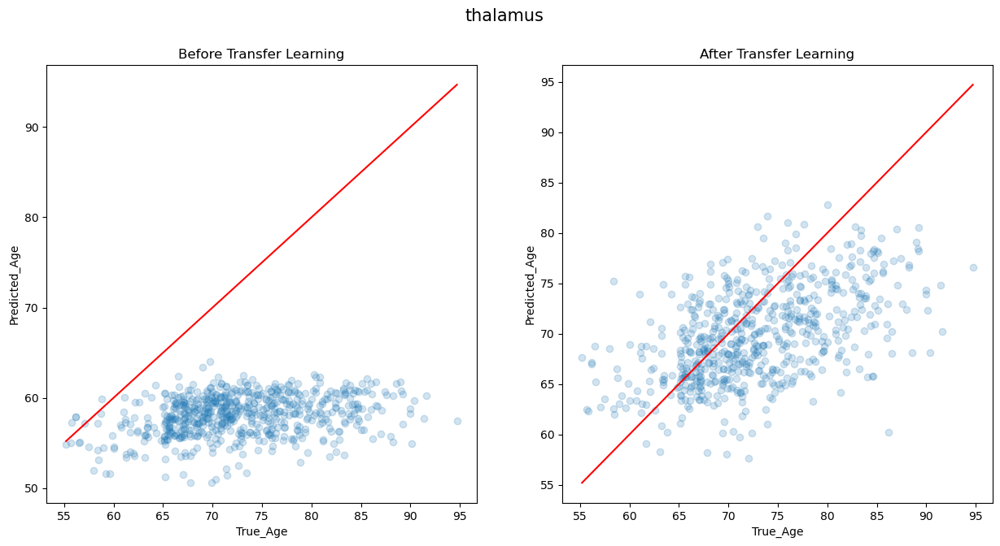

In [5]:
adni_test_root = root + 'adni'
adni_test_ages = pickel_load_(adni_test_root)

adni_tf_root = root + 'adni_tf'
adni_tf_ages = pickel_load(adni_tf_root)

for k, v in regions.items():
    pred_ages_lists1 = adni_test_ages[v]['pred_ages']
    true_ages_lists1 = adni_test_ages[v]['true_ages']

    pred_ages_lists2 = adni_tf_ages[v]['pred_ages']
    true_ages_lists2 = adni_tf_ages[v]['true_ages']
    
    age_plot_comparison(pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, v)

# UKB Plot

imgs 25656 25656
caudate 25656 25656
cerebellum 25656 25656
frontal_lobe 25656 25656
insula 25656 25656
occipital_lobe 25656 25656
parietal_lobe 25656 25656
putamen 25656 25656
temporal_lobe 25656 25656
thalamus 25656 25656
4 6414
4 6414
4 6414
4 6414
4 6414
4 6414
4 6414
4 6414
4 6414
4 6414
imgs 6414 6414 6414
caudate 6414 6414 6414
cerebellum 6414 6414 6414
frontal_lobe 6414 6414 6414
insula 6414 6414 6414
occipital_lobe 6414 6414 6414
parietal_lobe 6414 6414 6414
putamen 6414 6414 6414
temporal_lobe 6414 6414 6414
thalamus 6414 6414 6414


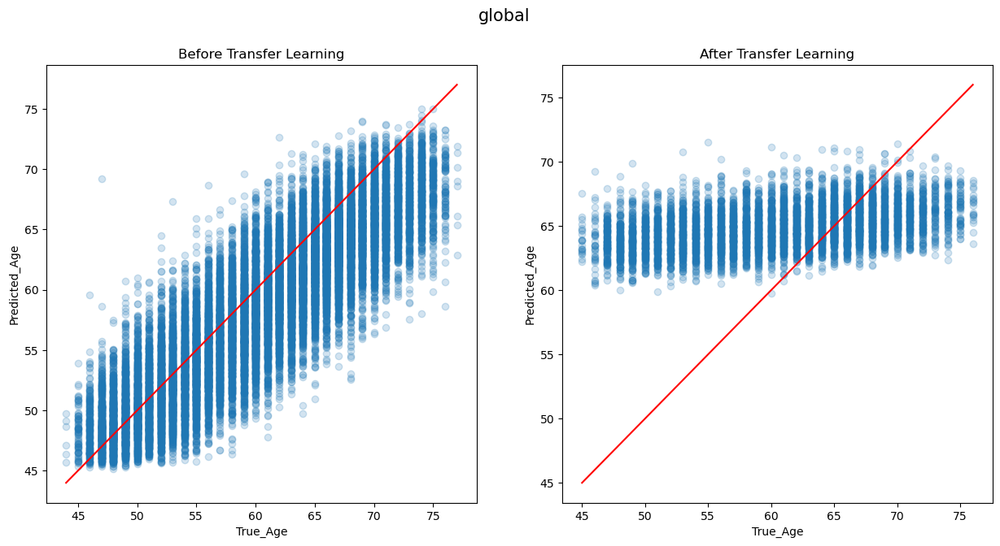

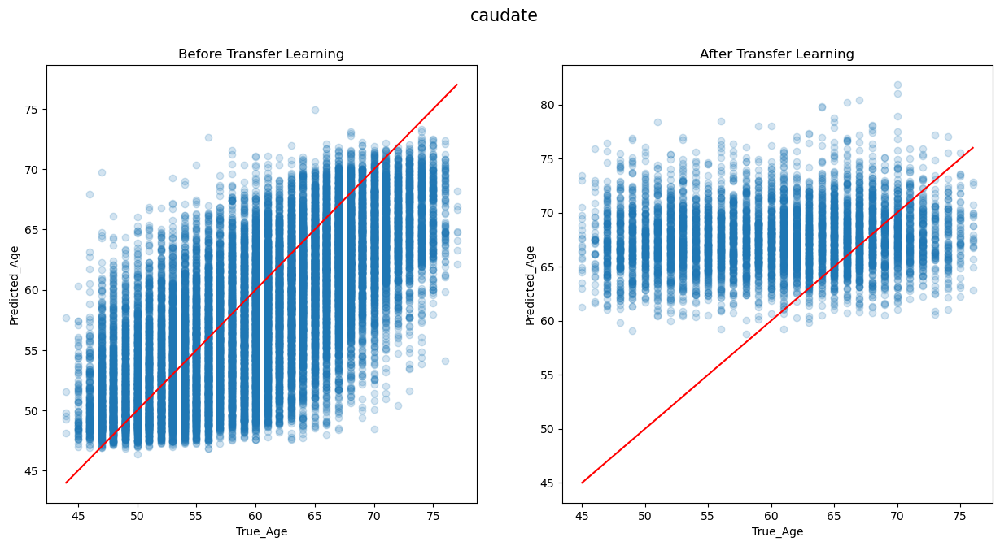

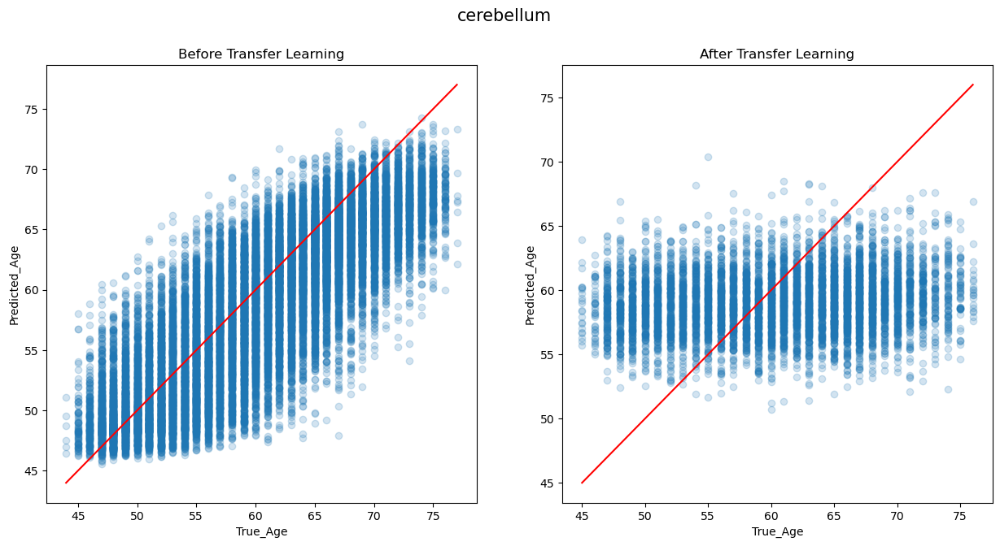

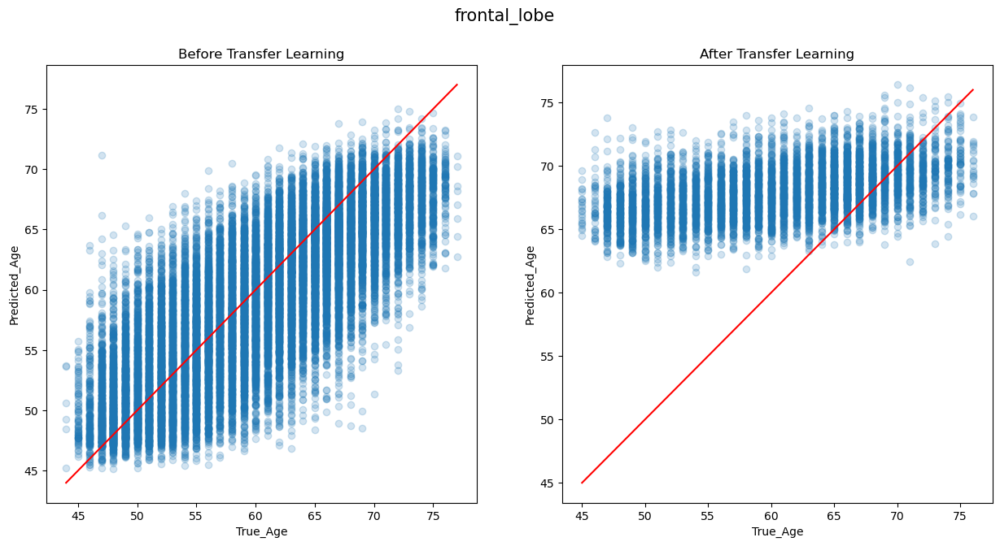

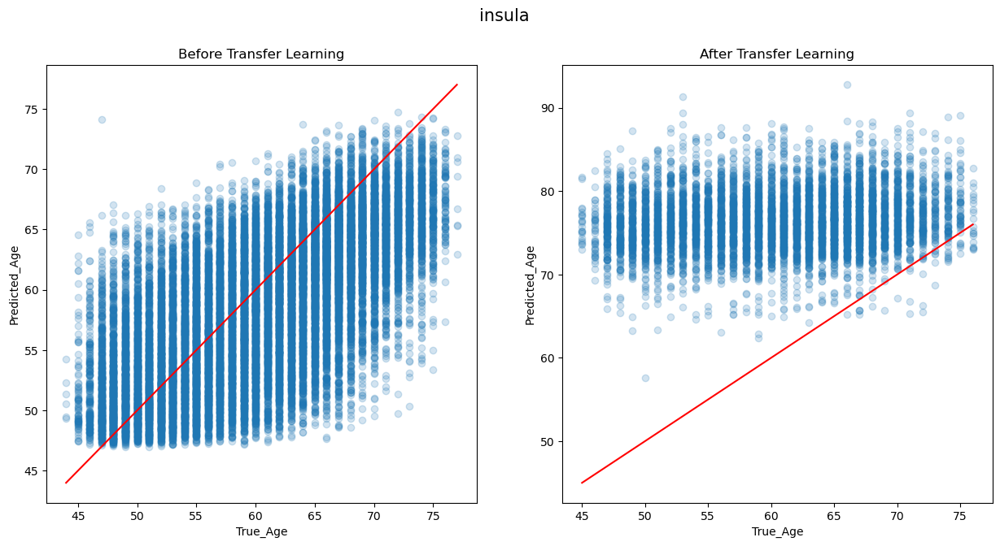

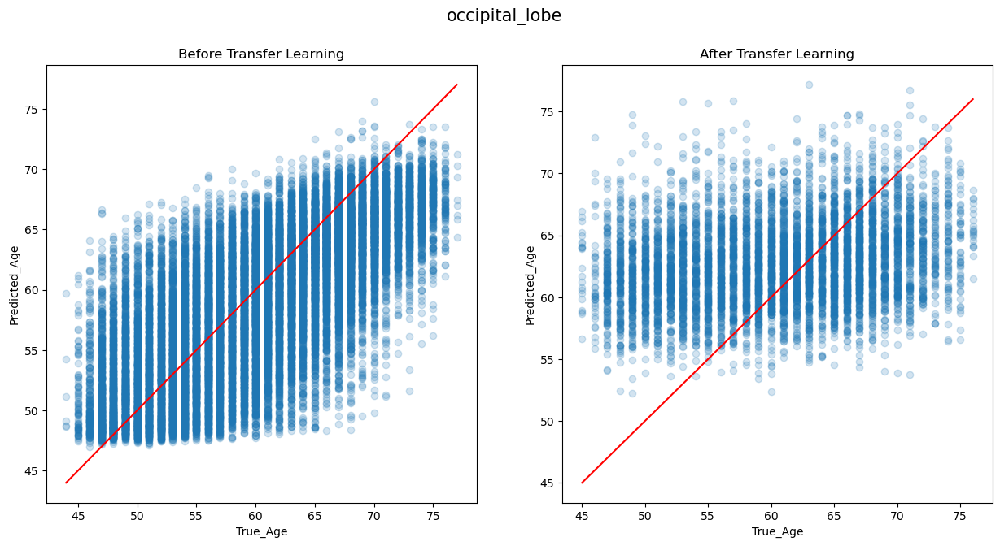

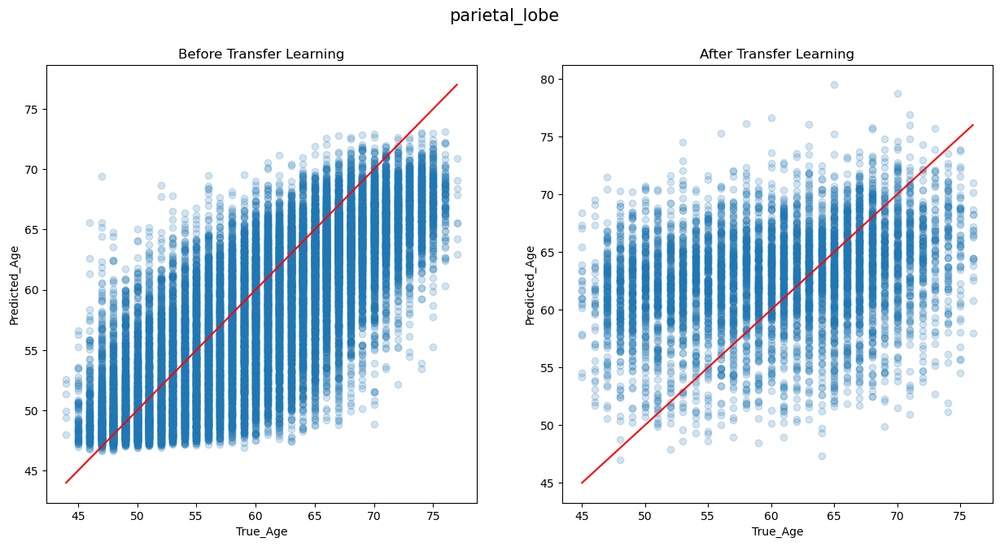

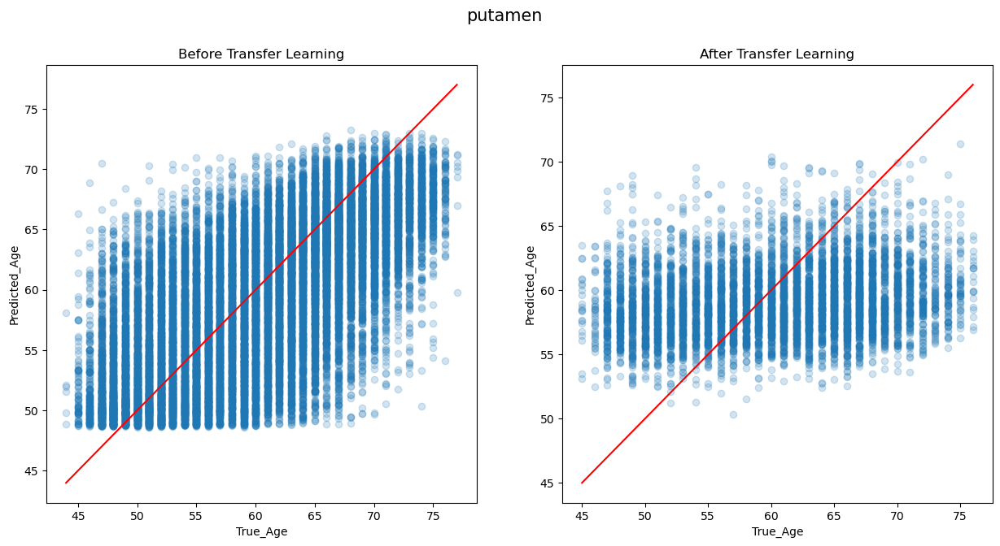

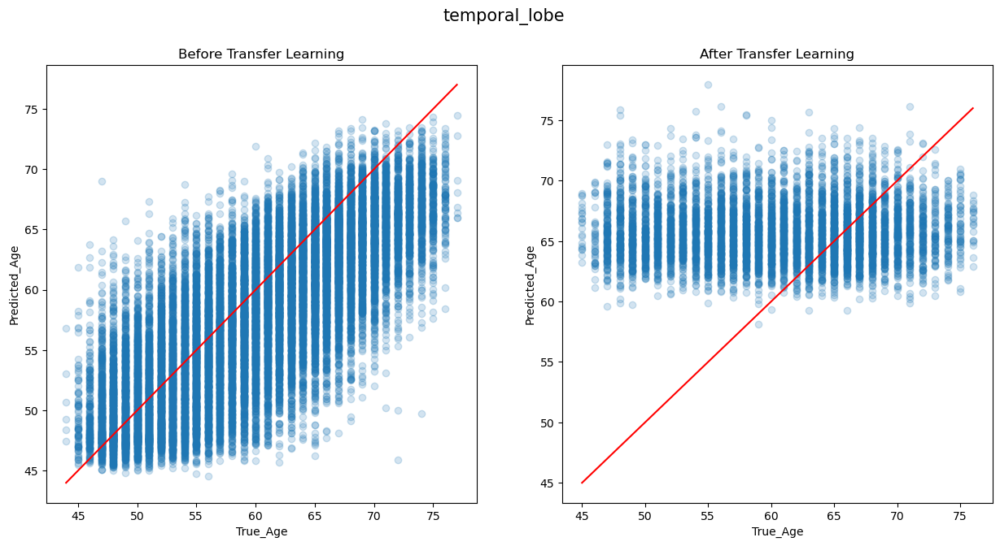

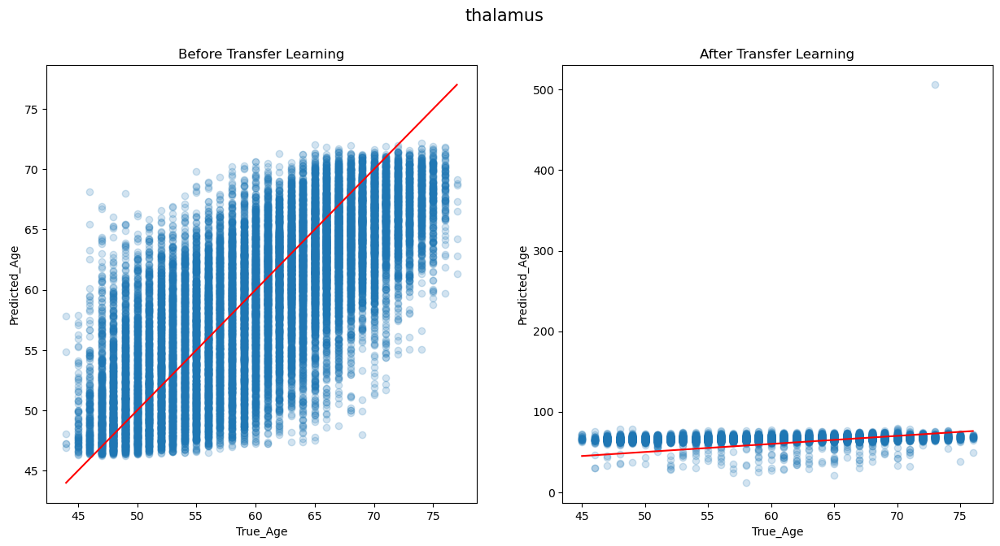

In [6]:
ukb_test_root = root + '/ukb/'
ukb_test_ages = pickel_load(ukb_test_root)

ukb_tf_root = root + '/ukb_tf/'
ukb_tf_ages = pickel_load_(ukb_tf_root)

for k, v in regions.items():
    pred_ages_lists1 = ukb_test_ages[v]['pred_ages']
    true_ages_lists1 = ukb_test_ages[v]['true_ages']

    pred_ages_lists2 = ukb_tf_ages[v]['pred_ages']
    true_ages_lists2 = ukb_tf_ages[v]['true_ages']
    
    age_plot_comparison(pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, v)

In [8]:
def age_plot_comparison_3(pred1, true1, pred2, true2, pred3, true3, region):
    # before transfer learning
    if region == 'imgs':
        region = 'global'
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 3, 1)
    plt.scatter(true1, pred1, alpha=0.2)
    plt.plot([min(true1), max(true1)], [min(true1), max(true1)], color='red')  # y=x line
    plt.title(f'UKBB')
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho1, p_val1 = stats.pearsonr(true1, pred1)
    print(f"correlation coefficient: {rho1:.3f}, p-value: {p_val1:.3f}")

    plt.subplot(1, 3, 2)
    plt.scatter(true2, pred2, alpha=0.2)
    plt.plot([min(true2), max(true2)], [min(true2), max(true2)], color='red')  # y=x line
    plt.title(f'ADNI: Before Transfer Learning')
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho2, p_val2 = stats.pearsonr(true2, pred2)
    print(f"correlation coefficient: {rho2:.3f}, p-value: {p_val2:.3f}")

    # after transfer learning
    plt.subplot(1, 3, 3)
    plt.scatter(true3, pred3, alpha=0.2)
    plt.plot([min(true3), max(true3)], [min(true3), max(true3)], color='red')  # y=x line
    plt.title(f'ADNI: After Transfer Learning')
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho3, p_val3 = stats.pearsonr(true3, pred3)
    print(f"correlation coefficient: {rho3:.3f}, p-value: {p_val3:.3f}")

    plt.suptitle(f'{region}', fontsize=15)

# for k, v in regions.items():

    # pred_ages_lists = ukb_test_ages[v]['pred_ages']
    # true_ages_lists = ukb_test_ages[v]['true_ages']
    
    # pred_ages_lists1 = adni_test_ages[v]['pred_ages']
    # true_ages_lists1 = adni_test_ages[v]['true_ages']

    # pred_ages_lists2 = adni_tf_ages[v]['pred_ages']
    # true_ages_lists2 = adni_tf_ages[v]['true_ages']

    # age_plot_comparison_3(pred_ages_lists, true_ages_lists, pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, v)
    
    
    # corrected_pred_ages_lists = ukb_test_ages[v]['corrected_pred_ages']
    # true_ages_lists = ukb_test_ages[v]['true_ages']
    
    # corrected_pred_ages_lists1 = adni_test_ages[v]['corrected_pred_ages']
    # true_ages_lists1 = adni_test_ages[v]['true_ages']

    # corrected_pred_ages_lists2 = adni_tf_ages[v]['corrected_pred_ages']
    # true_ages_lists2 = adni_tf_ages[v]['true_ages']

    # age_plot_comparison_3(corrected_pred_ages_lists, true_ages_lists, corrected_pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, v)


p-value:  0.0
p-value:  4.538440816994178e-44
p-value:  1.0378203295837712e-102
p-value:  0.0
p-value:  3.0632845395569827e-15
p-value:  2.5988598143695103e-47
p-value:  0.0
p-value:  1.455449472801455e-25
p-value:  4.783850769218017e-57
p-value:  0.0
p-value:  5.063805617322527e-29
p-value:  5.5547629555144813e-67
p-value:  0.0
p-value:  2.09612561275855e-11
p-value:  2.6559353389712787e-32
p-value:  0.0
p-value:  1.8107834067470648e-14
p-value:  3.321148271937073e-47
p-value:  0.0
p-value:  6.640164680786062e-14
p-value:  1.1637980142360293e-55
p-value:  0.0
p-value:  1.5657120528106933e-06
p-value:  5.557742779142889e-28
p-value:  0.0
p-value:  6.816578385443451e-48
p-value:  3.185146633530821e-81
p-value:  0.0
p-value:  2.059734349827054e-13
p-value:  1.9926230412600914e-43


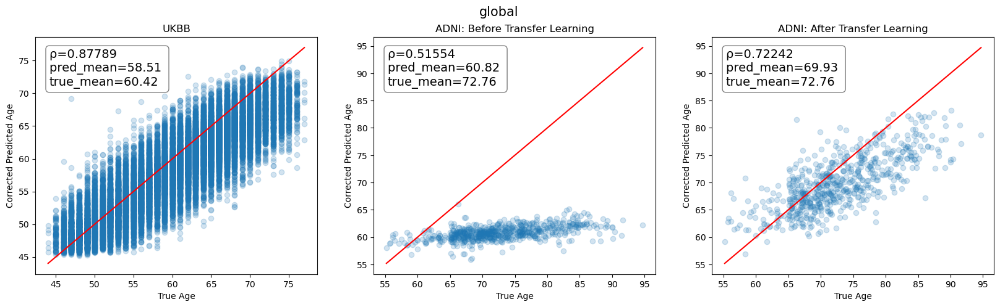

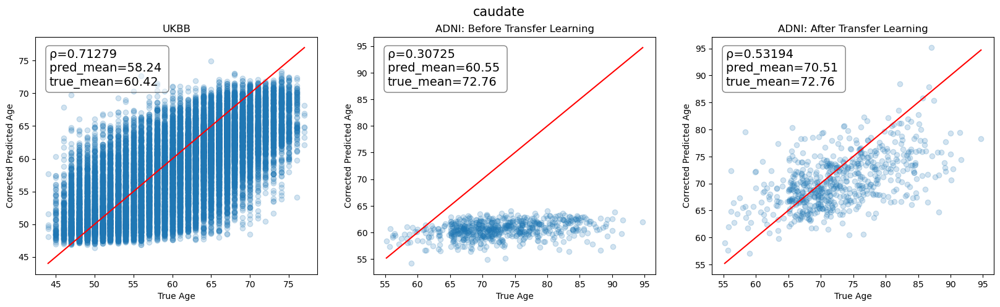

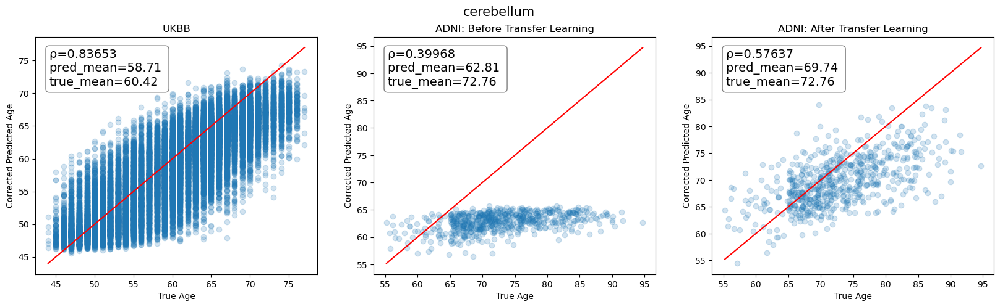

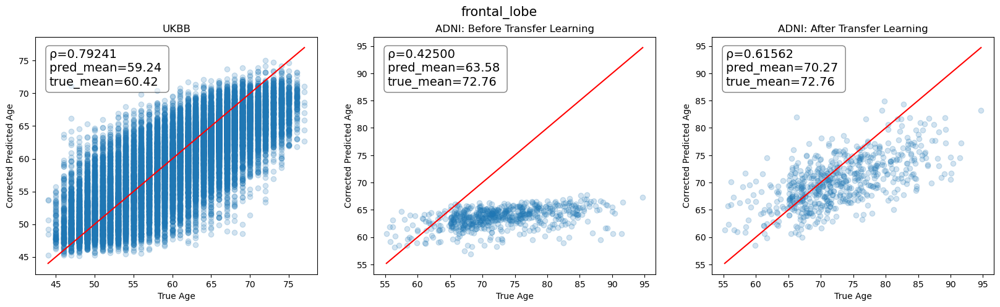

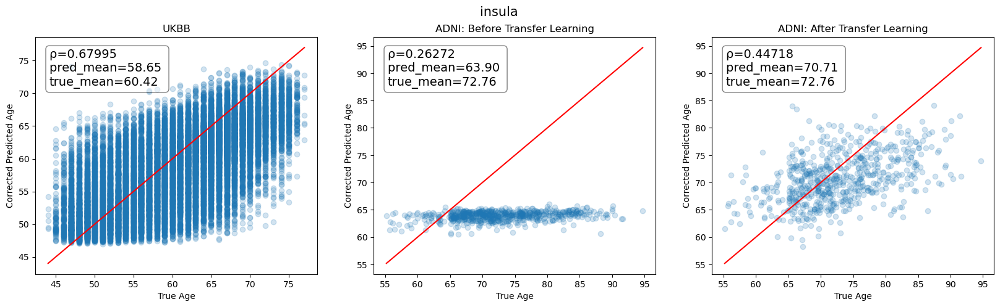

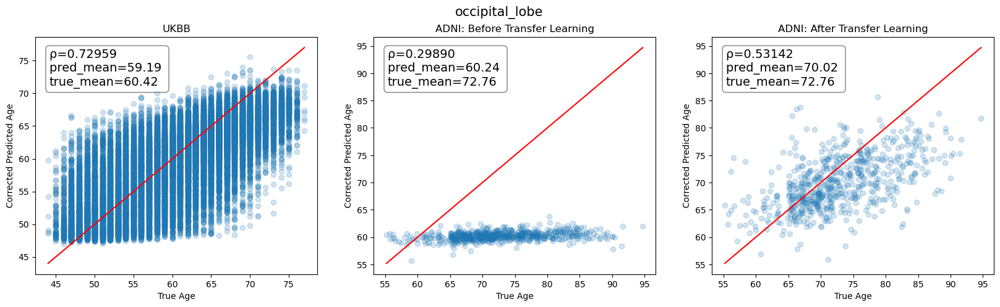

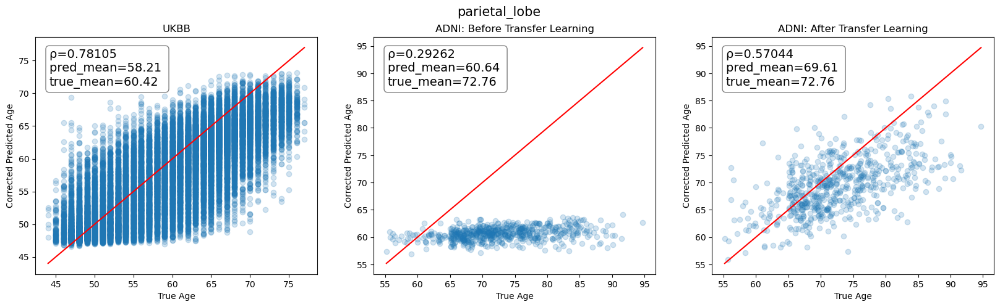

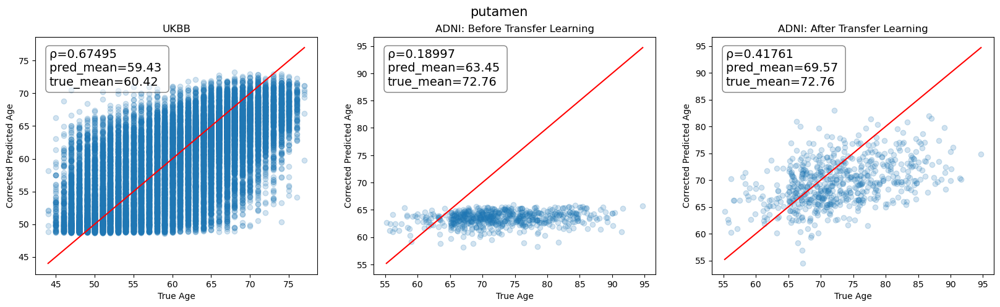

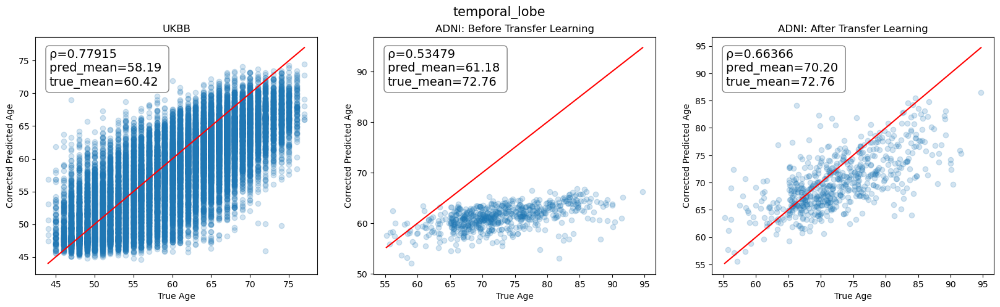

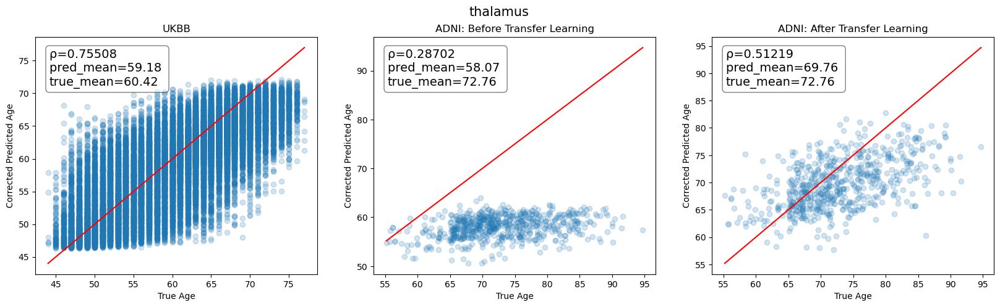

In [14]:
def age_plot_comparison_3_label(pred1, true1, pred2, true2, pred3, true3, region):
    # before transfer learning
    if region == 'imgs':
        region = 'global'
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 3, 1)
    plt.scatter(true1, pred1, alpha=0.2)
    plt.plot([min(true1), max(true1)], [min(true1), max(true1)], color='red')  # y=x line
    plt.title(f'UKBB')
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho1, p_val1 = stats.pearsonr(true1, pred1)
    print("p-value: ", p_val1)
    ukb_mean = np.mean(true1)
    model_mean1 = np.mean(pred1)
    plt.text(0.05, 0.95, f'ρ={rho1:.5f} \npred_mean={model_mean1:.2f} \ntrue_mean={ukb_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)

    plt.subplot(1, 3, 2)
    plt.scatter(true2, pred2, alpha=0.2)
    plt.plot([min(true2), max(true2)], [min(true2), max(true2)], color='red')  # y=x line
    plt.title(f'ADNI: Before Transfer Learning')
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho2, p_val2 = stats.pearsonr(true2, pred2)
    print("p-value: ", p_val2)
    adni_mean = np.mean(true2)
    model_mean2 = np.mean(pred2)
    plt.text(0.05, 0.95, f'ρ={rho2:.5f} \npred_mean={model_mean2:.2f} \ntrue_mean={adni_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)

    # after transfer learning
    plt.subplot(1, 3, 3)
    plt.scatter(true3, pred3, alpha=0.2)
    plt.plot([min(true3), max(true3)], [min(true3), max(true3)], color='red')  # y=x line
    plt.title(f'ADNI: After Transfer Learning')
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho3, p_val3 = stats.pearsonr(true3, pred3)
    print("p-value: ", p_val3)
    model_mean3 = np.mean(pred3)
    plt.text(0.05, 0.95, f'ρ={rho3:.5f} \npred_mean={model_mean3:.2f} \ntrue_mean={adni_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)

    plt.suptitle(f'{region}', fontsize=15)

for k, v in regions.items():

    pred_ages_lists = np.array(ukb_test_ages[v]['pred_ages'])
    true_ages_lists = np.array(ukb_test_ages[v]['true_ages'])
    
    pred_ages_lists1 = adni_test_ages[v]['pred_ages']
    true_ages_lists1 = adni_test_ages[v]['true_ages']

    pred_ages_lists2 = adni_tf_ages[v]['pred_ages']
    true_ages_lists2 = adni_tf_ages[v]['true_ages']

    age_plot_comparison_3_label(pred_ages_lists, true_ages_lists, pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, v)

p-value:  0.0
p-value:  4.538440816993565e-44
p-value:  1.03782695124801e-102
p-value:  0.0
p-value:  3.0632845395569827e-15
p-value:  2.5988711553419124e-47
p-value:  0.0
p-value:  1.455449472801455e-25
p-value:  4.783819914575918e-57
p-value:  0.0
p-value:  5.063805617322155e-29
p-value:  5.554780756330216e-67
p-value:  0.0
p-value:  2.0961256127584495e-11
p-value:  2.655941280485874e-32
p-value:  0.0
p-value:  1.810783406747242e-14
p-value:  3.321159082445527e-47
p-value:  0.0
p-value:  6.640164680786373e-14
p-value:  1.1637967328389644e-55
p-value:  0.0
p-value:  1.5657120528106933e-06
p-value:  5.557746506991645e-28
p-value:  0.0
p-value:  6.816578385443451e-48
p-value:  3.1851407617823395e-81
p-value:  0.0
p-value:  2.059734349827054e-13
p-value:  1.992623511239044e-43


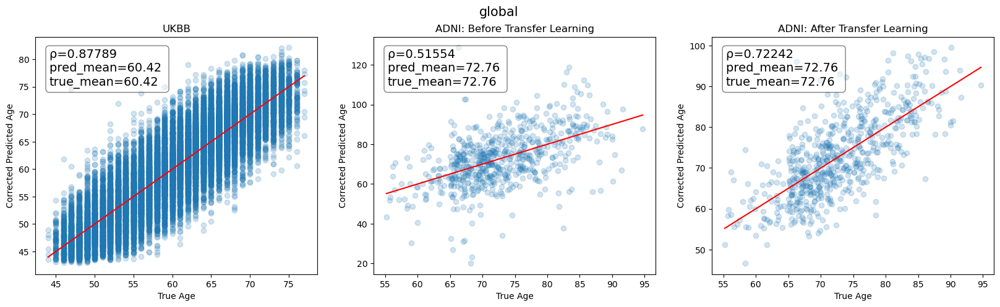

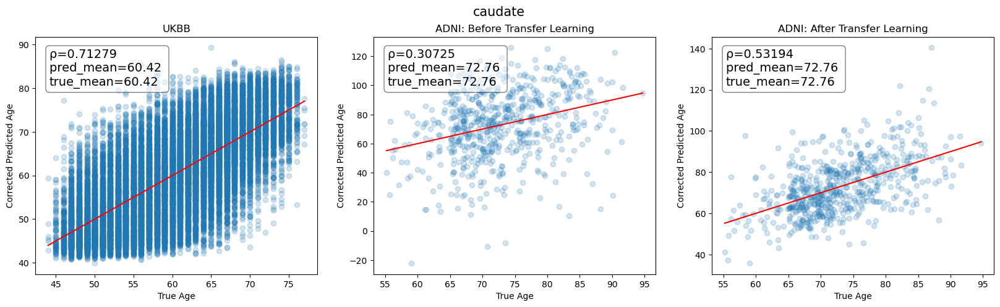

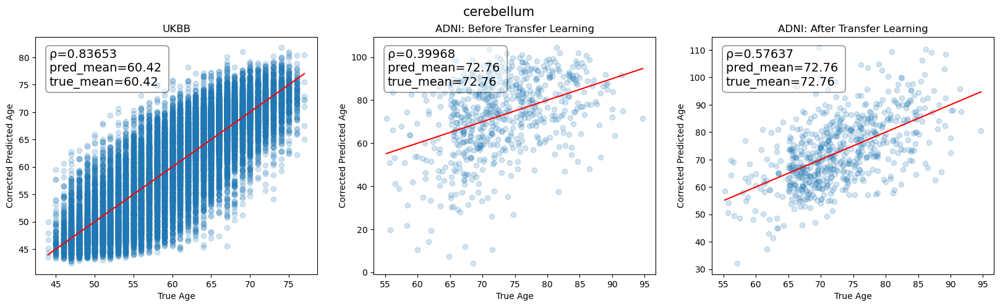

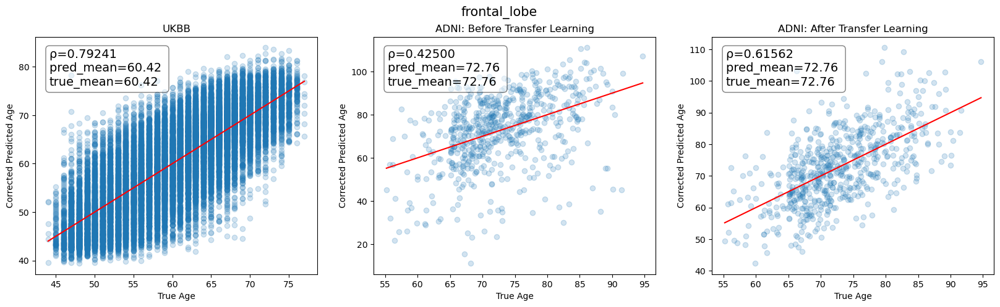

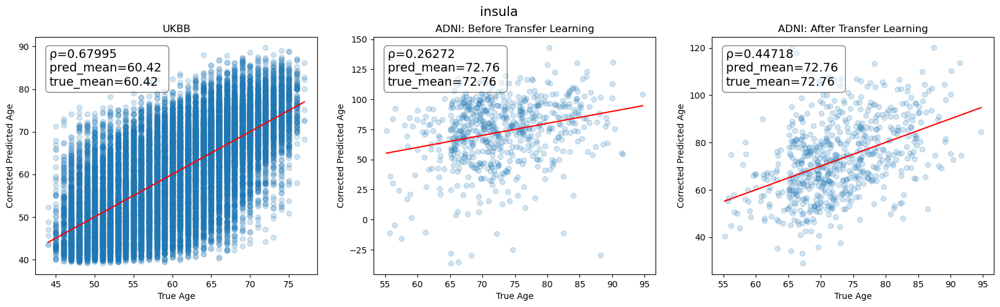

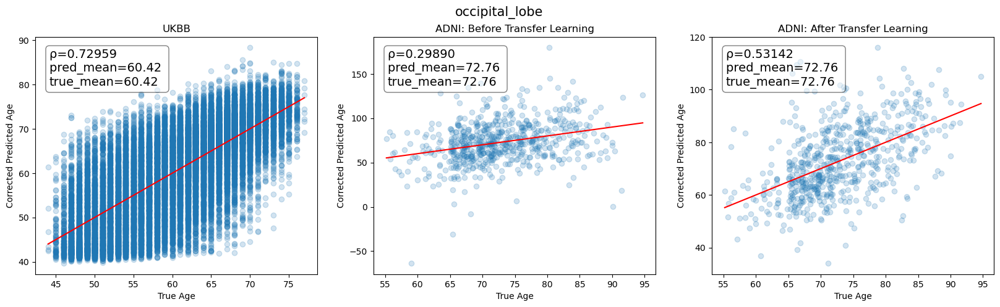

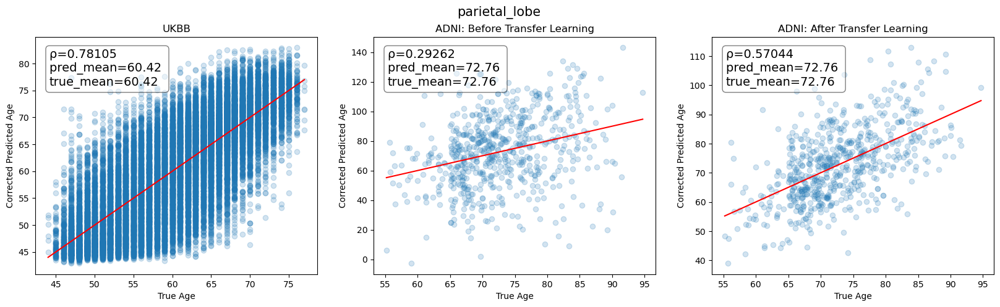

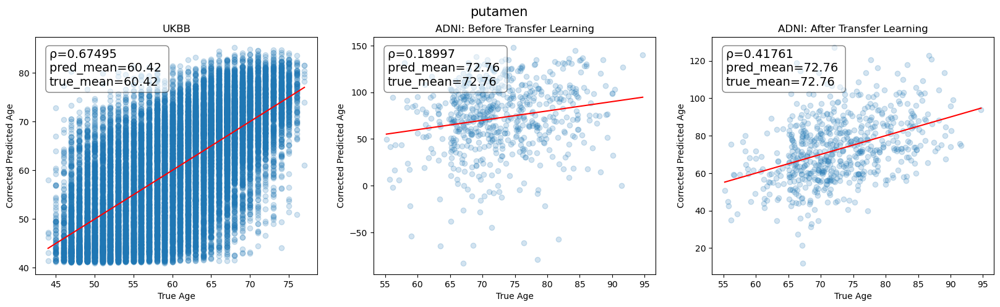

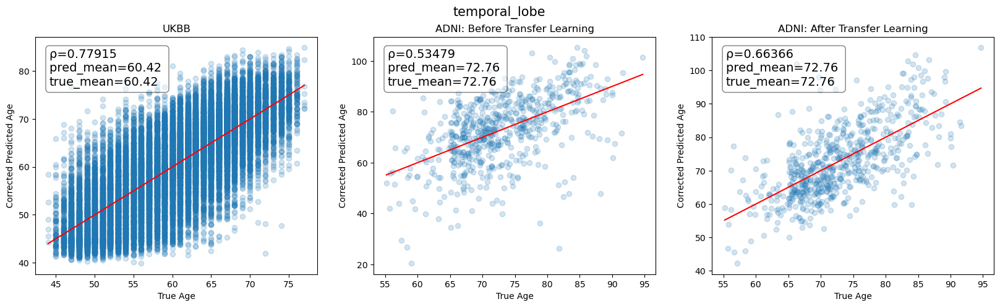

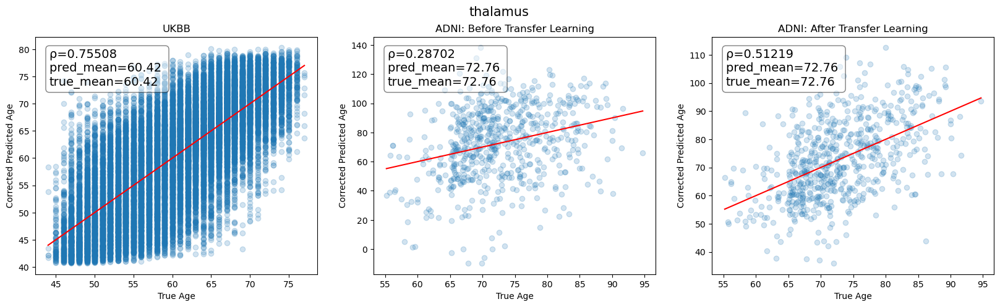

In [23]:
for k, v in regions.items():

    pred_ages_lists = ukb_test_ages[v]['corrected_pred_ages']
    true_ages_lists = np.array(ukb_test_ages[v]['true_ages'])
    
    pred_ages_lists1 = adni_test_ages[v]['corrected_pred_ages']
    true_ages_lists1 = np.array(adni_test_ages[v]['true_ages'])

    pred_ages_lists2 = adni_tf_ages[v]['corrected_pred_ages']
    true_ages_lists2 = np.array(adni_tf_ages[v]['true_ages'])

    age_plot_comparison_3_label(pred_ages_lists, true_ages_lists, pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, v)

In [27]:
for k, v in regions.items():
    ped_ages_lists2 = np.array(adni_tf_ages[v]['pred_ages'])
    corrected_pred_ages_lists2 = adni_tf_ages[v]['corrected_pred_ages']
    true_ages_lists2 = np.array(adni_tf_ages[v]['true_ages'])
    print("Region: ", v)
    print("Predicted Age: ", np.mean(ped_ages_lists2))
    print("Corrected Predicted Age: ", np.mean(corrected_pred_ages_lists2))
    print("True Age", np.mean(true_ages_lists2))
    
    rho, p_val = stats.pearsonr(true_ages_lists2, pred_ages_lists2)
    print("Correlation Coefficients:            ", rho, p_val)
    
    rho3, p_val3 = stats.pearsonr(true_ages_lists2, corrected_pred_ages_lists2)
    print("Correlation Coefficients(Corrected): ", rho3, p_val3)
    print("===========")

Region:  imgs
Predicted Age:  69.93163
Corrected Predicted Age:  72.76428
True Age 72.76428
Correlation Coefficients:             0.5121854303306743 1.992623511239044e-43
Correlation Coefficients(Corrected):  0.7224170776744889 1.03782695124801e-102
Region:  caudate
Predicted Age:  70.51176
Corrected Predicted Age:  72.764275
True Age 72.76428
Correlation Coefficients:             0.5121854303306743 1.992623511239044e-43
Correlation Coefficients(Corrected):  0.5319449301917061 2.5988711553419124e-47
Region:  cerebellum
Predicted Age:  69.73716
Corrected Predicted Age:  72.76428
True Age 72.76428
Correlation Coefficients:             0.5121854303306743 1.992623511239044e-43
Correlation Coefficients(Corrected):  0.5763675654359791 4.783819914575918e-57
Region:  frontal_lobe
Predicted Age:  70.26766
Corrected Predicted Age:  72.76429
True Age 72.76428
Correlation Coefficients:             0.5121854303306743 1.992623511239044e-43
Correlation Coefficients(Corrected):  0.6156240076154511 5.5

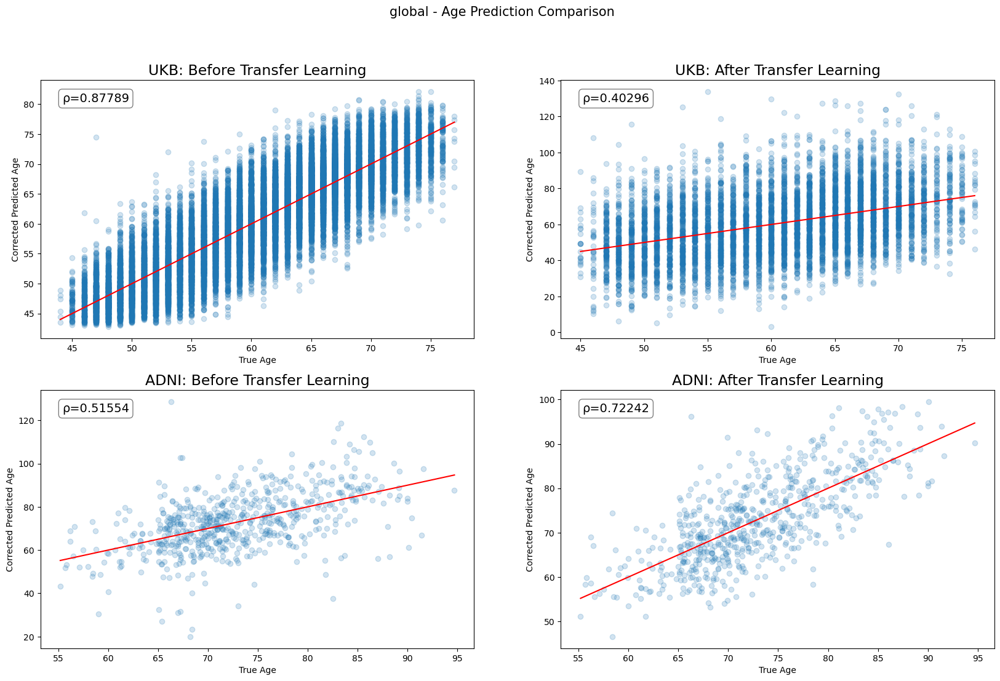

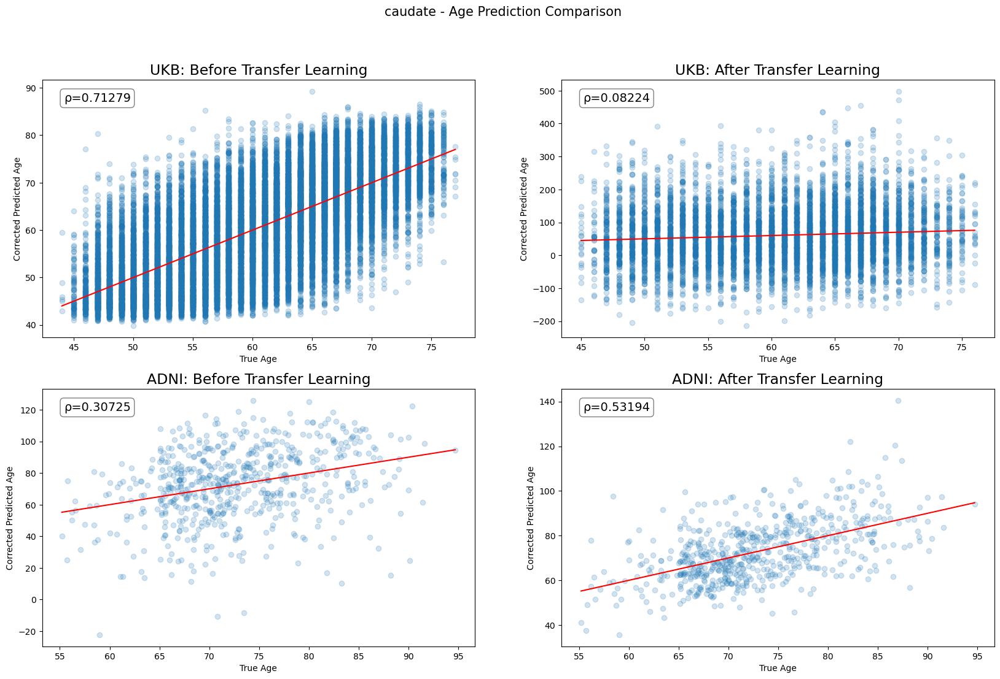

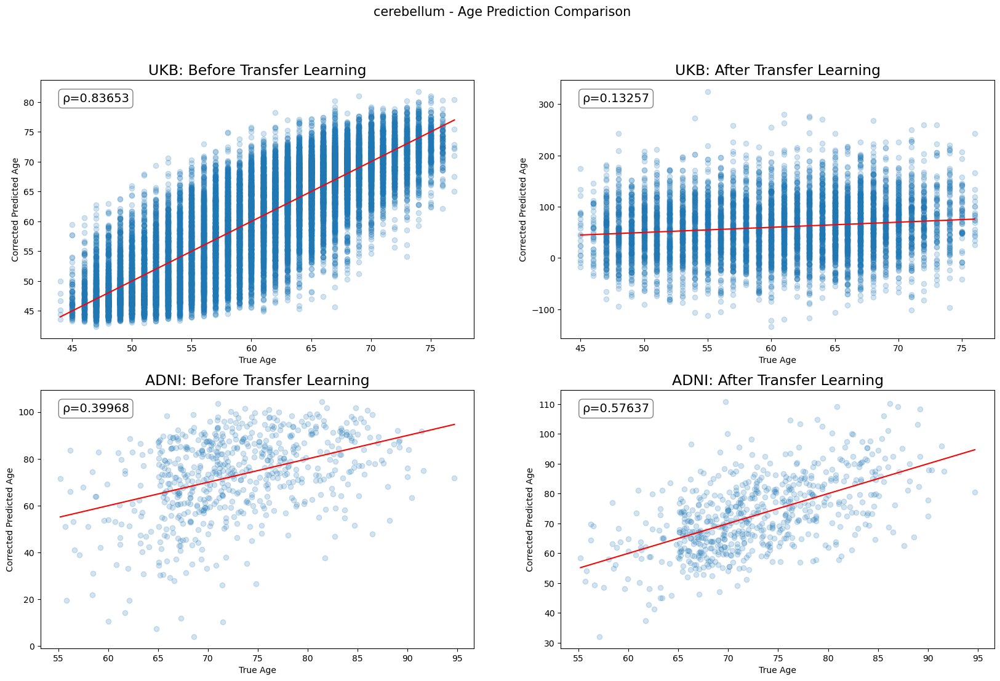

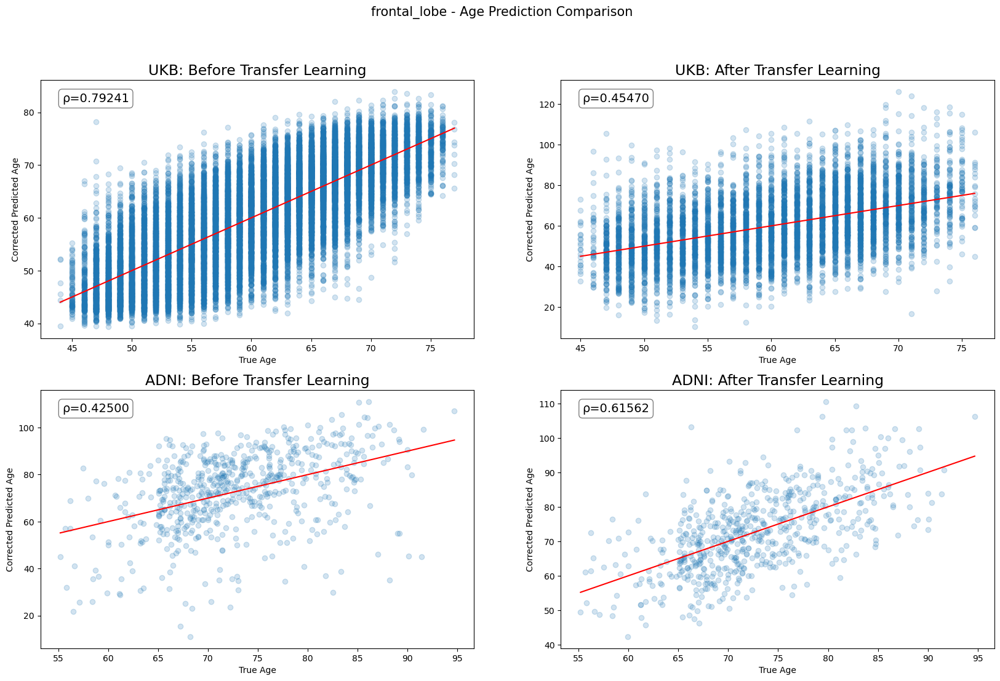

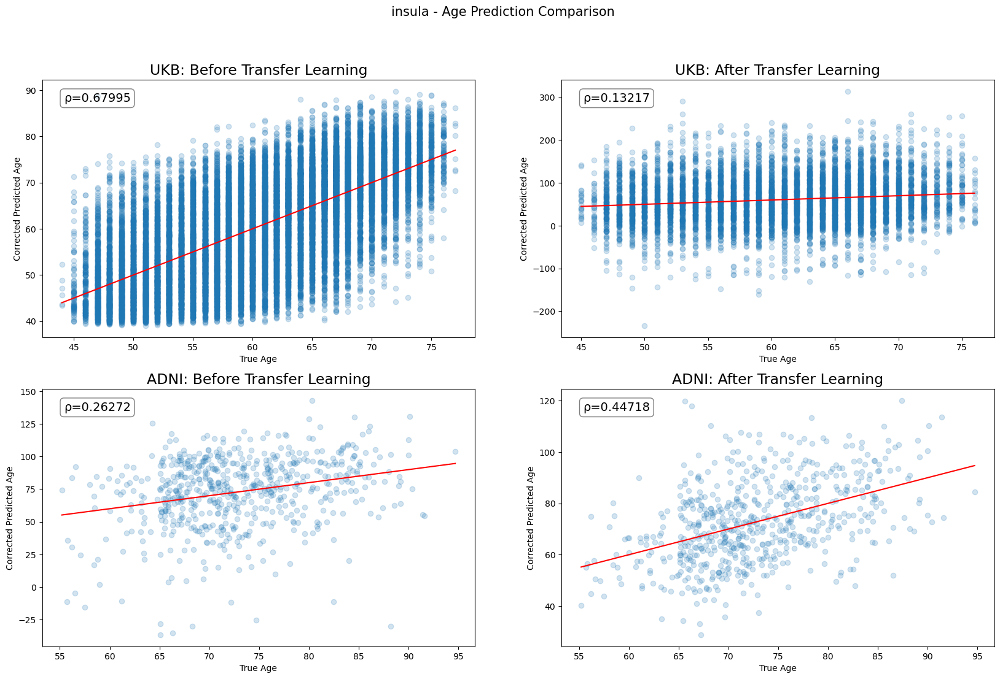

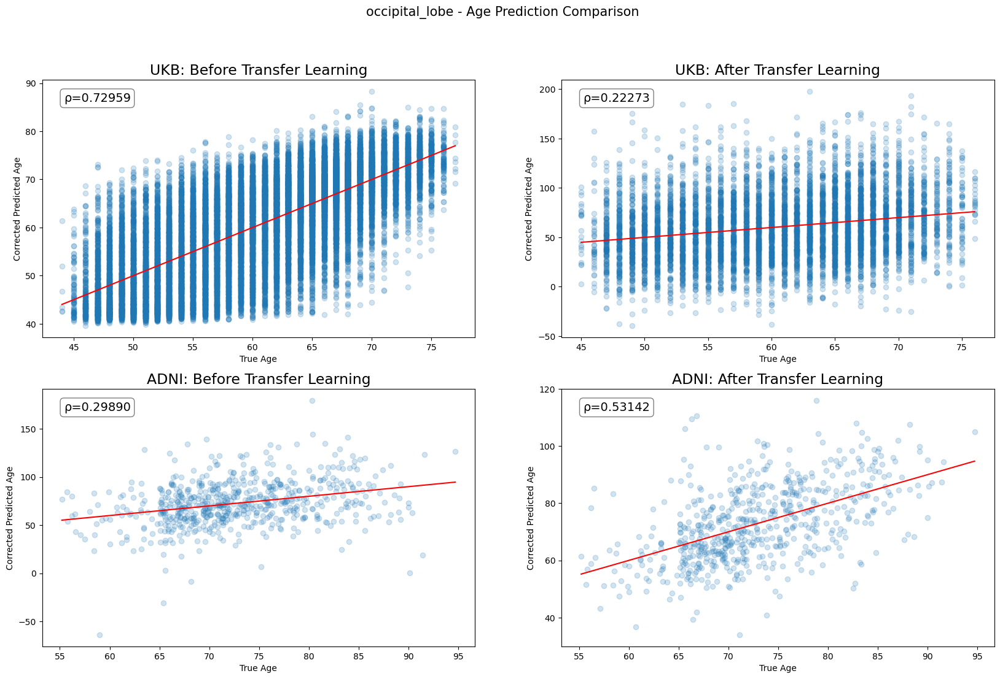

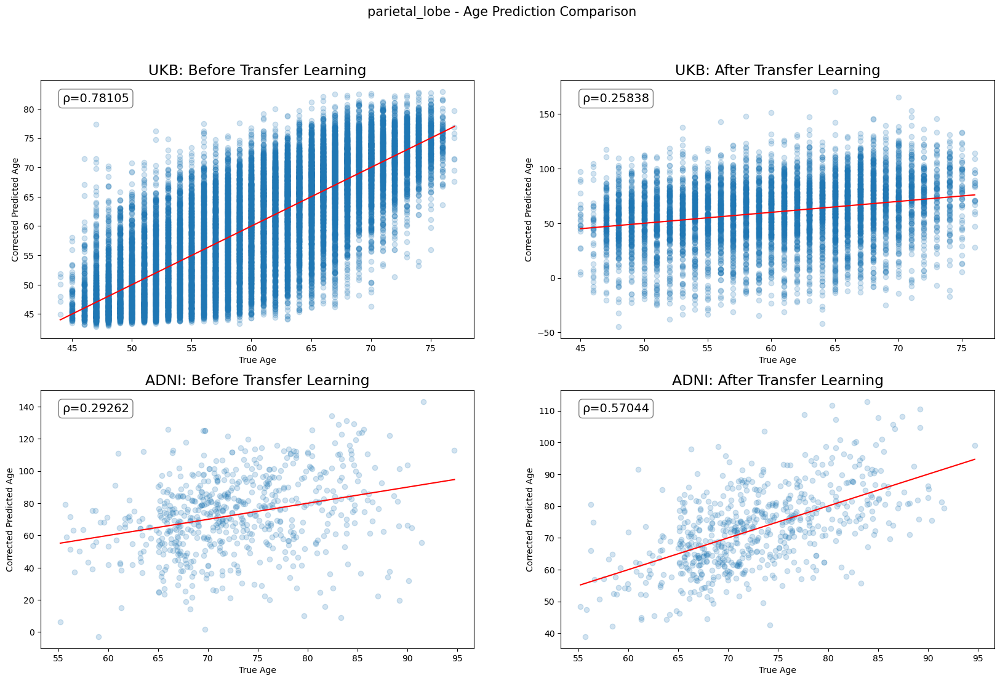

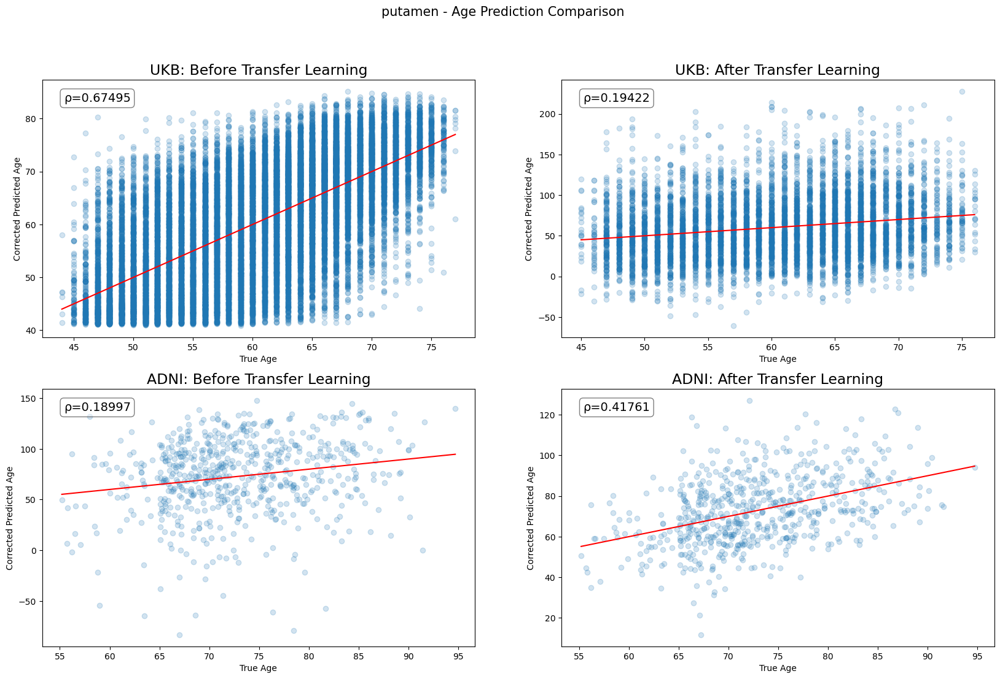

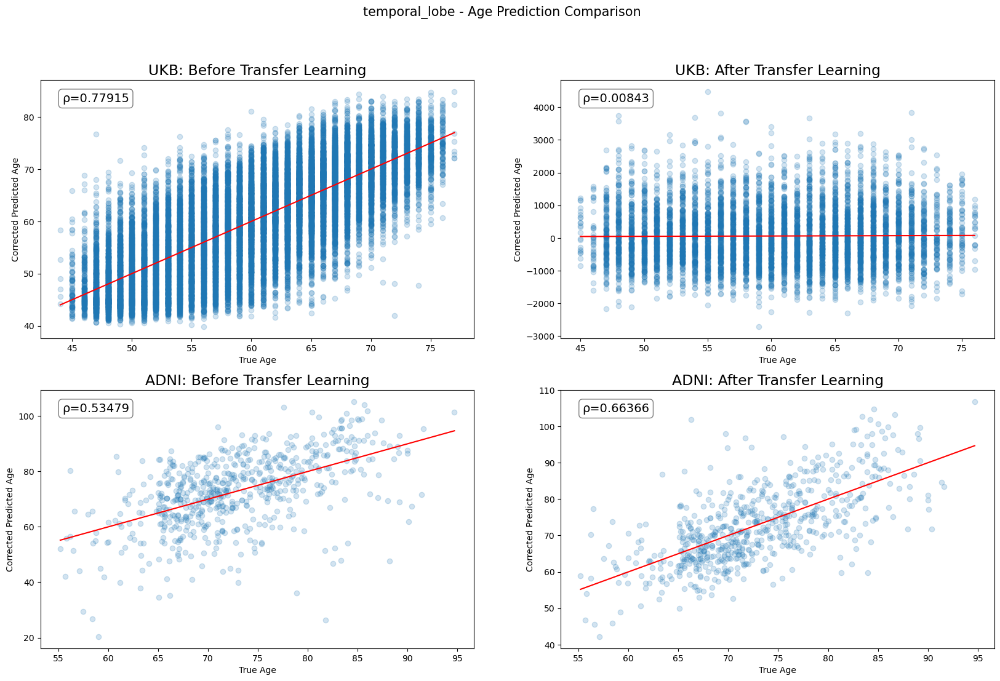

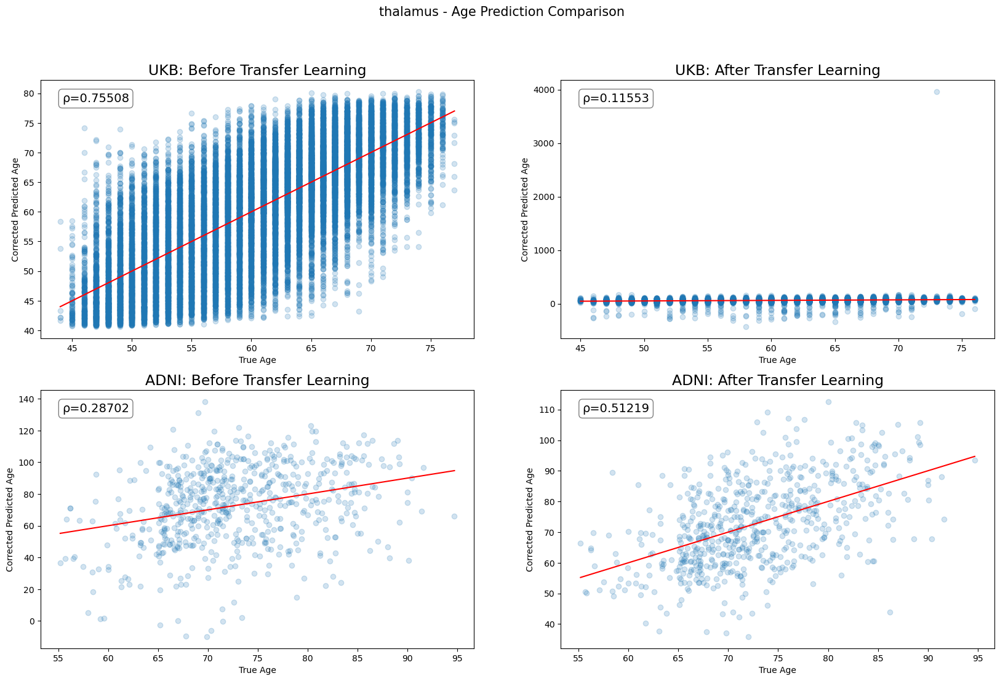

In [29]:
def age_plot_comparison_4(pred1, true1, pred2, true2, pred3, true3, pred4, true4, region):
    # Set region title for the plot
    if region == 'imgs':
        region = 'global'

    # Set up a figure with three subplots
    plt.figure(figsize=(20, 12))

    ukb_mean = sum(true1) / len(true1)
    adni_mean = sum(true2) / len(true2)

    # First subplot
    plt.subplot(2, 2, 1)
    plt.scatter(true1, pred1, alpha=0.2)
    plt.plot([min(true1), max(true1)], [min(true1), max(true1)], color='red')  # y=x line
    plt.title('UKB: Before Transfer Learning', fontsize=17)
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho1, p_val1 = stats.pearsonr(true1, pred1)
    model_mean1 = sum(pred1) / len(pred1)
    #plt.text(0.05, 0.95, f'ρ={rho1:.5f} \npred_mean={model_mean1:.2f} \ntrue_mean={ukb_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)
    plt.text(0.05, 0.95, f'ρ={rho1:.5f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)

    # Second subplot
    plt.subplot(2, 2, 3)
    plt.scatter(true2, pred2, alpha=0.2)
    plt.plot([min(true2), max(true2)], [min(true2), max(true2)], color='red')  # y=x line
    plt.title('ADNI: Before Transfer Learning', fontsize=17)
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho2, p_val2 = stats.pearsonr(true2, pred2)
    model_mean2 = sum(pred2) / len(pred2)
    #plt.text(0.05, 0.95, f'ρ={rho2:.5f} \npred_mean={model_mean2:.2f} \ntrue_mean={adni_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)
    plt.text(0.05, 0.95, f'ρ={rho2:.5f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)

    # Third subplot
    plt.subplot(2, 2, 2)
    plt.scatter(true3, pred3, alpha=0.2)
    plt.plot([min(true3), max(true3)], [min(true3), max(true3)], color='red')  # y=x line
    plt.title('UKB: After Transfer Learning', fontsize=17)
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho3, p_val3 = stats.pearsonr(true3, pred3)
    model_mean3 = sum(pred3) / len(pred3)
    #plt.text(0.05, 0.95, f'ρ={rho3:.5f} \npred_mean={model_mean3:.2f} \ntrue_mean={ukb_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)
    plt.text(0.05, 0.95, f'ρ={rho3:.5f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)
    
    # Fourth subplot
    plt.subplot(2, 2, 4)
    plt.scatter(true4, pred4, alpha=0.2)
    plt.plot([min(true4), max(true4)], [min(true4), max(true4)], color='red')  # y=x line
    plt.title('ADNI: After Transfer Learning', fontsize=17)
    plt.xlabel('True Age')
    plt.ylabel('Corrected Predicted Age')
    rho4, p_val4 = stats.pearsonr(true4, pred4)
    model_mean4 = sum(pred4) / len(pred4)
    #plt.text(0.05, 0.95, f'ρ={rho4:.5f} \npred_mean={model_mean4:.2f} \ntrue_mean={adni_mean:.2f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)
    plt.text(0.05, 0.95, f'ρ={rho4:.5f}', transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5), fontsize=14)
    # Overall title
    plt.suptitle(f'{region} - Age Prediction Comparison', fontsize=15)
    plt.show()

for k, v in regions.items():

    pred_ages_lists1 = ukb_test_ages[v]['corrected_pred_ages']
    true_ages_lists1 = ukb_test_ages[v]['true_ages']
    
    pred_ages_lists2 = adni_test_ages[v]['corrected_pred_ages']
    true_ages_lists2 = adni_test_ages[v]['true_ages']

    pred_ages_lists3 = ukb_tf_ages[v]['corrected_pred_ages']
    true_ages_lists3 = ukb_tf_ages[v]['true_ages']
    
    pred_ages_lists4 = adni_tf_ages[v]['corrected_pred_ages']
    true_ages_lists4 = adni_tf_ages[v]['true_ages']

    age_plot_comparison_4(pred_ages_lists1, true_ages_lists1, pred_ages_lists2, true_ages_lists2, pred_ages_lists3, true_ages_lists3, pred_ages_lists4, true_ages_lists4, v)


# Age distribution

### 1. Global

In [8]:
def age_hist(data):

    plt.hist(data['global_true'], bins=30, alpha=0.5, label='True Age', density=True, edgecolor='black')
    plt.hist(data['global_pred'], bins=30, alpha=0.5, label='Predicted Age', density=True, edgecolor='black')
    plt.hist(data['global_pred_tf'], bins=30, alpha=0.5, label='Predicted Age_tf', density=True, edgecolor='black')

    plt.title('Age Distribution of Healty Individuals')
    plt.xlabel('Age')
    plt.ylabel('Density')

    plt.legend(loc='upper right')
    plt.show()

    true_var = data['global_true'].var()
    pred_var = data['global_pred'].var()
    pred_tf_var = data['global_pred_tf'].var()

    print(f"{true_var:.3f}, {pred_var:.3f}, {pred_tf_var:.3f}")

In [9]:
adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[0]]['true_ages'],
    'global_pred': adni_test_ages[regions[0]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[0]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,60.816328,69.931633
std,7.127740,1.296001,4.912734
min,55.200001,55.875352,56.903214
25%,67.599998,59.997666,66.438114
50%,71.750000,60.769911,69.500134
75%,77.450001,61.632045,73.430405
max,94.699997,66.054049,83.259163


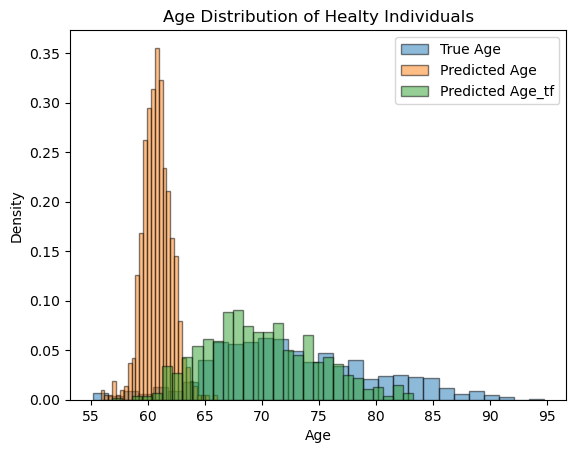

50.805, 1.680, 24.135


In [10]:
age_hist(adni_ages_lists_df)

### 2. caudate

In [11]:
num = 1
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

caudate


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,60.547619,70.511757
std,7.127740,1.550377,4.872831
min,55.200001,54.199302,57.022549
25%,67.599998,59.620308,66.980698
50%,71.750000,60.650774,69.885151
75%,77.450001,61.687146,73.546392
max,94.699997,64.100678,95.148834


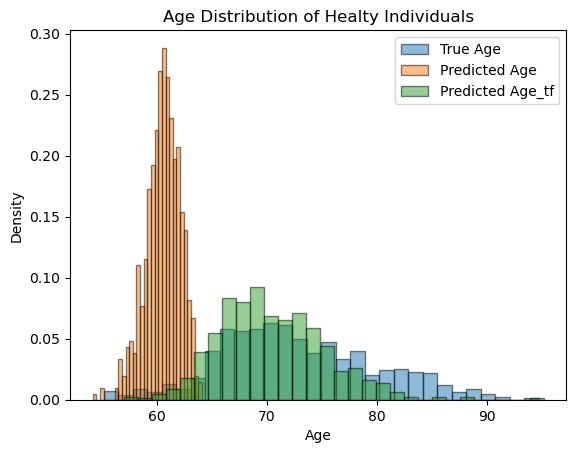

50.805, 2.404, 23.744


In [12]:
age_hist(adni_ages_lists_df)

# 3. cerebellum

In [211]:
num = 2
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

cerebellum


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,63.623368,72.177895
std,7.127740,3.615078,5.480347
min,55.200001,51.946328,59.725730
25%,67.599998,61.391173,68.077254
50%,71.750000,64.190533,71.229316
75%,77.450001,66.632866,76.312874
max,94.699997,68.608652,83.192287


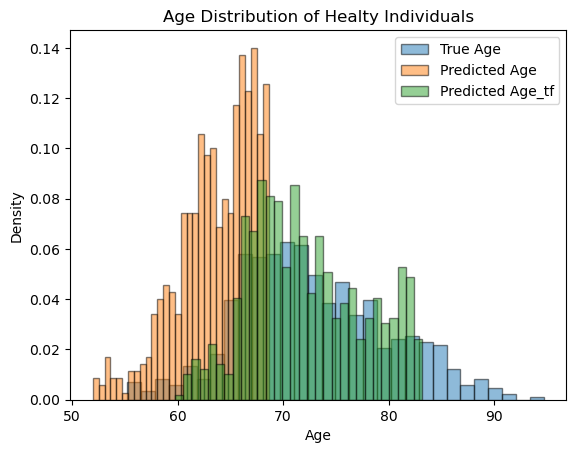

50.805, 13.069, 30.034


In [212]:
age_hist(adni_ages_lists_df)

# 4. frontal lobe

In [213]:
num = 3
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

frontal_lobe


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,60.863492,72.912873
std,7.127740,4.007662,4.394527
min,55.200001,51.108135,63.485958
25%,67.599998,57.958760,69.426219
50%,71.750000,61.052741,72.406672
75%,77.450001,63.783244,76.346937
max,94.699997,69.250149,81.382498


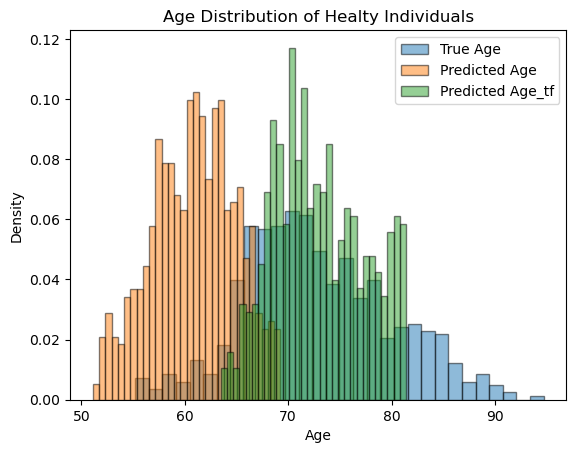

50.805, 16.061, 19.312


In [214]:
age_hist(adni_ages_lists_df)

## 5. insula

In [215]:
num = 4
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

insula


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,62.710765,73.173902
std,7.127740,3.494299,2.582929
min,55.200001,52.038224,67.519146
25%,67.599998,60.346295,71.194890
50%,71.750000,63.357103,72.808367
75%,77.450001,65.647471,74.975540
max,94.699997,67.408226,78.501770


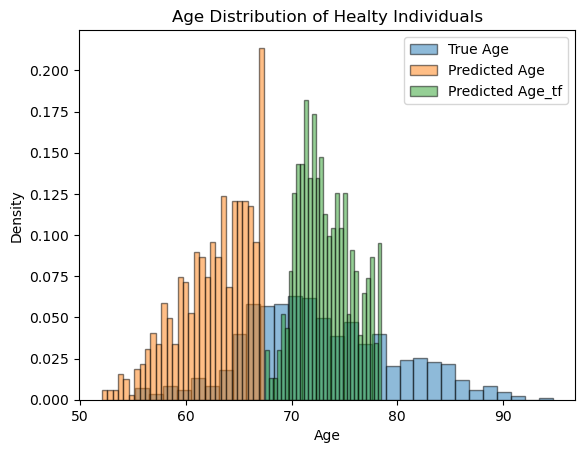

50.805, 12.210, 6.672


In [216]:
age_hist(adni_ages_lists_df)

## 6. Occipital Lobe

In [217]:
num = 5
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

occipital_lobe


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,61.756408,72.739749
std,7.127740,4.129617,5.514796
min,55.200001,51.129383,61.199564
25%,67.599998,58.602565,68.622914
50%,71.750000,62.389066,71.868702
75%,77.450001,65.096839,77.015986
max,94.699997,68.398571,83.392618


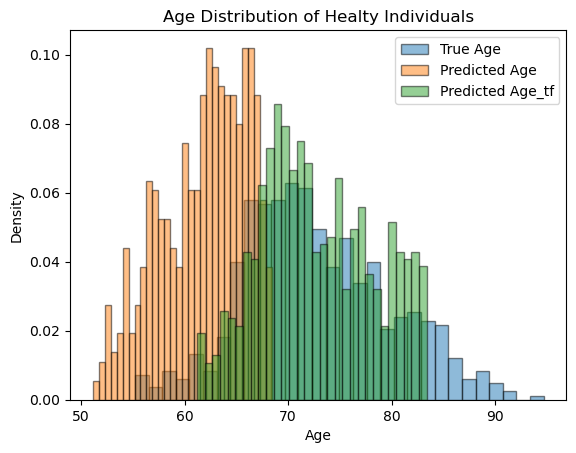

50.805, 17.054, 30.413


In [218]:
age_hist(adni_ages_lists_df)

## 7. Parietal Lobe

In [220]:
num = 6
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

parietal_lobe


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,62.040780,72.390940
std,7.127740,3.681166,4.957651
min,55.200001,52.353315,62.775924
25%,67.599998,59.398365,68.298418
50%,71.750000,62.525142,71.850293
75%,77.450001,64.831851,76.473415
max,94.699997,68.573851,81.296604


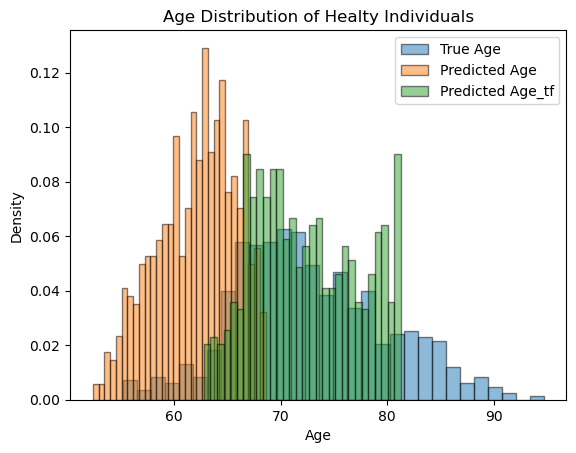

50.805, 13.551, 24.578


In [221]:
age_hist(adni_ages_lists_df)

## 8. Putamen

In [222]:
num = 7
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

putamen


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,65.654979,72.234399
std,7.127740,2.918462,4.857343
min,55.200001,53.751307,61.826563
25%,67.599998,64.638716,68.716220
50%,71.750000,66.792779,71.164103
75%,77.450001,67.841640,75.636649
max,94.699997,67.963373,82.642790


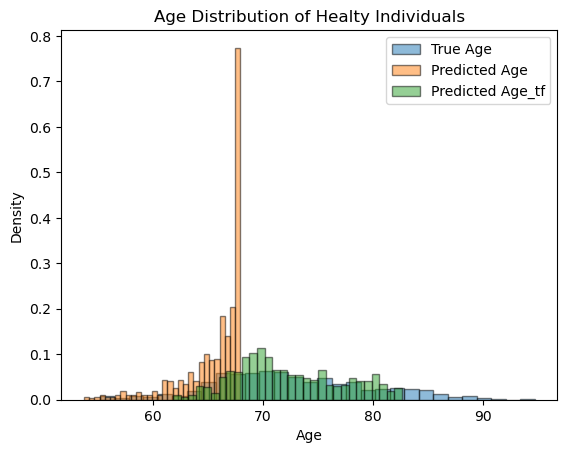

50.805, 8.517, 23.594


In [223]:
age_hist(adni_ages_lists_df)

## 8. Temporal Lobe

In [224]:
num = 8
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

temporal_lobe


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,62.739308,72.885698
std,7.127740,3.985607,5.522267
min,55.200001,50.667056,61.140240
25%,67.599998,60.048148,68.716228
50%,71.750000,63.435350,71.920909
75%,77.450001,65.924511,77.352860
max,94.699997,68.493137,83.781002


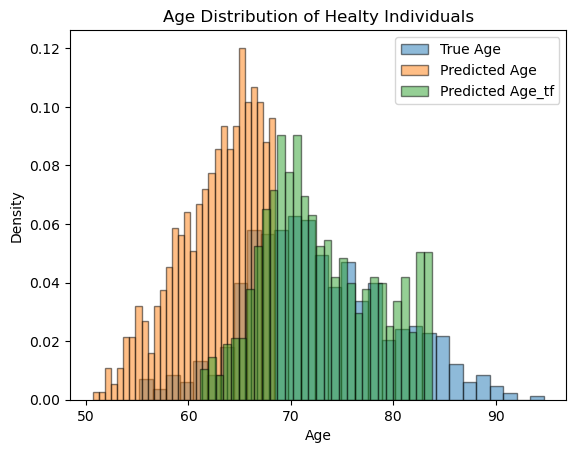

50.805, 15.885, 30.495


In [225]:
age_hist(adni_ages_lists_df)

## Thalamus 

In [226]:
num = 9
print(regions[num])

adni_ages_lists_map = {
    'global_true': adni_test_ages[regions[num]]['true_ages'],
    'global_pred': adni_test_ages[regions[num]]['pred_ages'],
    'global_pred_tf': adni_tf_ages[regions[num]]['pred_ages']
}
adni_ages_lists_df = pd.DataFrame(adni_ages_lists_map)
adni_ages_lists_df.describe()

thalamus


,global_true,global_pred,global_pred_tf
count,630.000000,630.000000,630.000000
mean,72.764282,61.419781,72.744908
std,7.127740,3.738640,4.714549
min,55.200001,51.879375,64.661985
25%,67.599998,58.589744,68.880490
50%,71.750000,61.678534,71.474388
75%,77.450001,64.328460,76.989803
max,94.699997,66.792141,81.495525


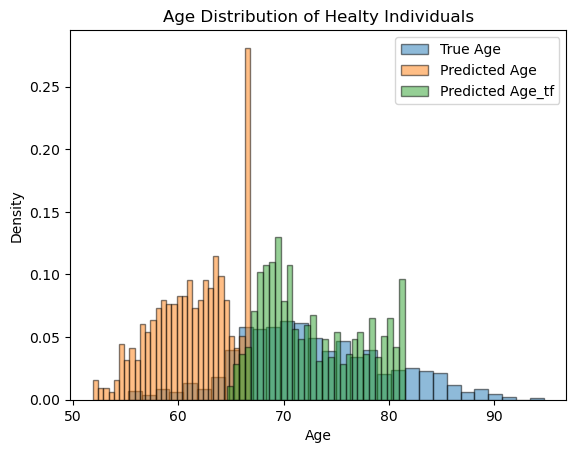

50.805, 13.977, 22.227


In [227]:
age_hist(adni_ages_lists_df)

In [4]:
adni_ages = adni_tf_ages['imgs']['true_ages']
ukb_ages = ukb_test_ages['imgs']['true_ages']

plt.hist(adni_ages, bins=30, alpha=0.5, label='ADNI', density=True, edgecolor='black')
plt.hist(ukb_ages, bins=30, alpha=0.5, label='UKB', density=True, edgecolor='black')
plt.title('Age Distribution of Healthy Individuals')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend(loc='upper right')
plt.show()

NameError: name 'adni_tf_ages' is not defined

In [256]:
pd.DataFrame(ukb_ages).describe()

,0
count,25656.000000
mean,60.416004
std,7.382730
min,44.000000
25%,54.750000
50%,61.000000
75%,66.000000
max,77.000000


In [257]:
pd.DataFrame(adni_ages).describe()

,0
count,630.000000
mean,72.764282
std,7.127740
min,55.200001
25%,67.599998
50%,71.750000
75%,77.450001
max,94.699997


In [260]:
print(pd.DataFrame(adni_ages).var())

0    50.804676
dtype: float32


In [261]:
print(pd.DataFrame(ukb_ages).var())

0    54.504696
dtype: float32
